In [1]:
import sys
sys.version

'2.7.12 (default, Nov 12 2018, 14:36:49) \n[GCC 5.4.0 20160609]'

# Data Process

In [2]:
#import pyrealsense2 as rs
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import joblib
#import scipy.misc
import tensorflow as tf
#from skimage.restoration import denoise_tv_chambolle
from tensorboardX import SummaryWriter

In [3]:
pp_path = '/home/obin/t2b_dataset/pickandplace'
data_list = np.sort([pp_path+'/data/'+x for x in os.listdir(os.path.join(pp_path,'data'))])
pp_path = '/home/obin/t2b_dataset/pickandplace/0202'
data_list2 = np.sort([pp_path+'/data/'+x for x in os.listdir(os.path.join(pp_path,'data'))])
data_list = np.hstack((data_list,data_list2))
num_data = len(data_list)
print('num of data : ', num_data)

('num of data : ', 201)


In [4]:
def pretty_print_input(arr, ori = False):
    arr = np.squeeze(arr)
    if ori == True : 
        s_x, s_y, s_d, s_ori = arr[0:4]
        g_x, g_y, g_d, g_ori = arr[4:8]
        
        print('start pixel        goal pixek')
        print('x : %04f    x : %04f'%(s_x,g_x))
        print('y : %04f    y : %04f'%(s_y,g_y))
        print('z : %04f    z : %04f'%(s_d,g_d))
        print('o : %04f    o : %04f'%(s_ori,g_ori))
        print('\n')
    else : 
        s_x, s_y, s_d = arr[0:3]
        g_x, g_y, g_d = arr[3:6]
        
        print('start pixel        goal pixek')
        print('x : %04f    x : %04f'%(s_x,g_x))
        print('y : %04f    y : %04f'%(s_y,g_y))
        print('z : %04f    z : %04f'%(s_d,g_d))
        print('\n')
    
    
def pretty_print_out(arr):
    arr = np.squeeze(arr)
    s_px, s_py, s_pz, s_ox, s_oy, s_oz, s_ow = arr[0:7]
    g_px, g_py, g_pz, g_ox, g_oy, g_oz, g_ow = arr[7:14]
    
    print('start pose        goal pose')
    print('x : %04f    x : %04f'%(s_px,g_px))
    print('y : %04f    y : %04f'%(s_py,g_py))
    print('z : %04f    z : %04f'%(s_pz,g_pz))
    print('x : %04f    x : %04f'%(s_ox,g_ox))
    print('y : %04f    y : %04f'%(s_oy,g_oy))
    print('z : %04f    z : %04f'%(s_oz,g_oz))
    print('w : %04f    w : %04f'%(s_ow,g_ow))
    print('\n')
    


## depth image preprocess

In [5]:
np.random.shuffle(data_list)
data_list

array(['/home/obin/t2b_dataset/pickandplace/0202/data/0048.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0047.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0130.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0000.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0043.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0143.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0119.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0083.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0100.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0026.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0001.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0097.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0110.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0094.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0108.dat.gz',
       '/home/obin/t2b_dataset/pick

-----------data 0----------


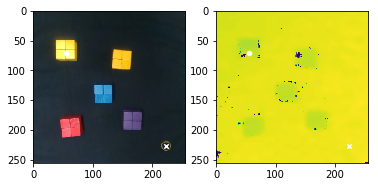

start pix : (55,71,686.8984375) -> goal pix : (223,227,731.0)
start pixel        goal pixek
x : 55.000000    x : 223.000000
y : 71.000000    y : 227.000000
z : 686.898438    z : 731.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.629413    x : 0.911041
y : -0.101985    y : 0.183149
z : -0.193915    z : -0.167904
x : 0.025451    x : -0.050049
y : 0.996479    y : 0.962426
z : -0.015449    z : 0.062829
w : 0.078377    w : 0.259391


-----------data 1----------


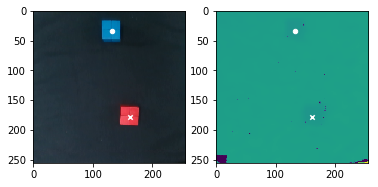

start pix : (132,33,674.1796875) -> goal pix : (162,178,677.171875)
start pixel        goal pixek
x : 132.000000    x : 162.000000
y : 33.000000    y : 178.000000
z : 674.179688    z : 677.171875
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.573285    x : 0.822622
y : 0.010760    y : 0.052869
z : -0.207535    z : -0.150223
x : -0.048992    x : 0.015886
y : 0.992040    y : 0.990926
z : -0.047899    z : -0.039289
w : 0.105652    w : 0.127552


-----------data 2----------


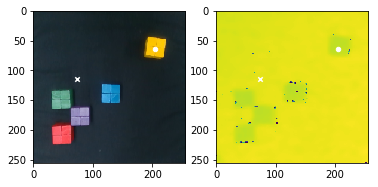

start pix : (205,64,681.0) -> goal pix : (74,115,723.0)
start pixel        goal pixek
x : 205.000000    x : 74.000000
y : 64.000000    y : 115.000000
z : 681.000000    z : 723.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.624130    x : 0.726451
y : 0.147840    y : -0.074438
z : -0.208429    z : -0.200395
x : -0.036458    x : -0.039864
y : 0.991362    y : 0.986802
z : -0.013174    z : -0.023720
w : 0.125297    w : 0.155144


-----------data 3----------


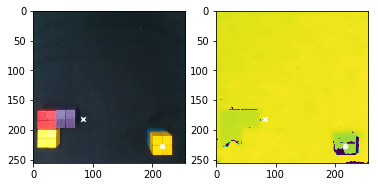

start pix : (216,227,638.0) -> goal pix : (83,181,723.4453125)
start pixel        goal pixek
x : 216.000000    x : 83.000000
y : 227.000000    y : 181.000000
z : 638.000000    z : 723.445312
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.903887    x : 0.818916
y : 0.155671    y : -0.034489
z : -0.146249    z : -0.188144
x : -0.052814    x : 0.714548
y : 0.962006    y : -0.662251
z : -0.003259    z : -0.139463
w : 0.267851    w : -0.177189


-----------data 4----------


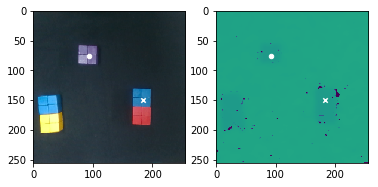

start pix : (93,76,678.0) -> goal pix : (184,150,684.6328125)
start pixel        goal pixek
x : 93.000000    x : 184.000000
y : 76.000000    y : 150.000000
z : 678.000000    z : 684.632812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.637051    x : 0.767772
y : -0.059223    y : 0.080045
z : -0.198560    z : -0.142378
x : 0.011128    x : 0.031025
y : 0.995199    y : 0.992563
z : -0.016131    z : -0.024459
w : 0.095888    w : 0.115139


-----------data 5----------


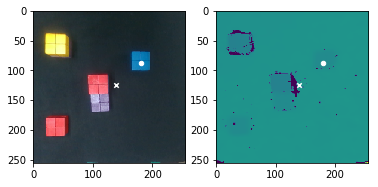

start pix : (180,88,676.0) -> goal pix : (139,124,720.0)
start pixel        goal pixek
x : 180.000000    x : 139.000000
y : 88.000000    y : 124.000000
z : 676.000000    z : 720.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.666269    x : 0.707669
y : 0.095766    y : 0.036386
z : -0.203526    z : -0.211440
x : -0.018277    x : 0.708309
y : 0.996762    y : -0.704450
z : -0.014786    z : 0.026868
w : 0.076890    w : -0.036432


-----------data 6----------


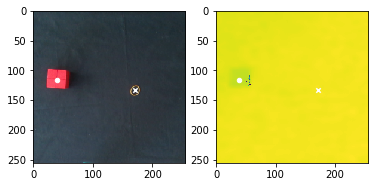

start pix : (39,116,671.4296875) -> goal pix : (171,133,725.0)
start pixel        goal pixek
x : 39.000000    x : 171.000000
y : 116.000000    y : 133.000000
z : 671.429687    z : 725.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.709711    x : 0.744283
y : -0.141224    y : 0.079846
z : -0.207428    z : -0.213454
x : 0.036796    x : -0.040400
y : 0.994934    y : 0.997147
z : -0.004031    z : -0.014021
w : 0.093467    w : 0.062202


-----------data 7----------


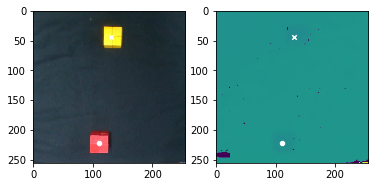

start pix : (111,222,681.0) -> goal pix : (131,44,675.864318848)
start pixel        goal pixek
x : 111.000000    x : 131.000000
y : 222.000000    y : 44.000000
z : 681.000000    z : 675.864319
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.908288    x : 0.612442
y : -0.023900    y : 0.017142
z : -0.207229    z : -0.142603
x : -0.000789    x : 0.013606
y : 0.983092    y : 0.990614
z : 0.019489    z : 0.017413
w : 0.182072    w : 0.134888


-----------data 8----------


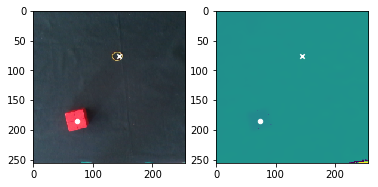

start pix : (73,185,675.6015625) -> goal pix : (144,76,716.1015625)
start pixel        goal pixek
x : 73.000000    x : 144.000000
y : 185.000000    y : 76.000000
z : 675.601562    z : 716.101562
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.819153    x : 0.644071
y : -0.081228    y : 0.023925
z : -0.210295    z : -0.193351
x : -0.136122    x : -0.096218
y : 0.985294    y : 0.989943
z : 0.029777    z : -0.037643
w : 0.098893    w : 0.096631


-----------data 9----------


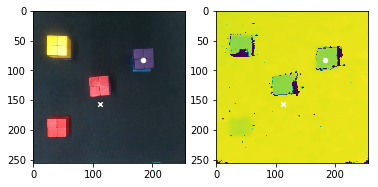

start pix : (184,82,630.0) -> goal pix : (112,156,729.0)
start pixel        goal pixek
x : 184.000000    x : 112.000000
y : 82.000000    y : 156.000000
z : 630.000000    z : 729.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.665609    x : 0.789408
y : 0.093495    y : -0.018448
z : -0.158225    z : -0.201743
x : 0.012772    x : 0.002062
y : 0.995037    y : 0.998415
z : 0.001440    z : 0.006741
w : 0.098671    w : 0.055846


-----------data 10----------


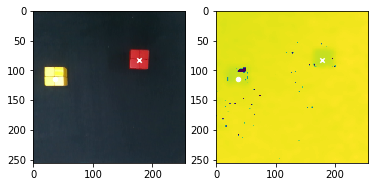

start pix : (36,115,683.0) -> goal pix : (178,83,673.0)
start pixel        goal pixek
x : 36.000000    x : 178.000000
y : 115.000000    y : 83.000000
z : 683.000000    z : 673.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.697360    x : 0.666454
y : -0.130754    y : 0.101365
z : -0.200690    z : -0.148603
x : 0.005332    x : -0.005543
y : 0.998324    y : 0.993465
z : -0.015356    z : -0.035673
w : 0.055549    w : 0.108278


-----------data 11----------


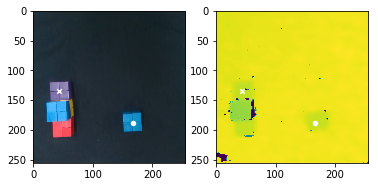

start pix : (167,188,678.0) -> goal pix : (43,135,676.0)
start pixel        goal pixek
x : 167.000000    x : 43.000000
y : 188.000000    y : 135.000000
z : 678.000000    z : 676.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.833174    x : 0.743591
y : 0.070886    y : -0.134028
z : -0.210415    z : -0.156670
x : -0.022140    x : -0.042070
y : 0.989481    y : 0.983903
z : -0.007968    z : -0.019057
w : 0.142737    w : 0.172633


-----------data 12----------


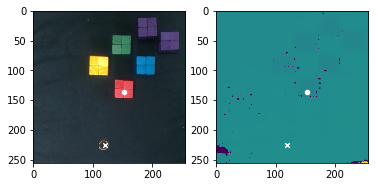

start pix : (153,136,677.0) -> goal pix : (120,226,729.1328125)
start pixel        goal pixek
x : 153.000000    x : 120.000000
y : 136.000000    y : 226.000000
z : 677.000000    z : 729.132812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.749655    x : 0.917150
y : 0.052181    y : -0.008772
z : -0.193589    z : -0.191652
x : -0.010572    x : -0.045039
y : 0.993771    y : 0.987179
z : 0.010606    z : 0.020822
w : 0.110431    w : 0.151709


-----------data 13----------


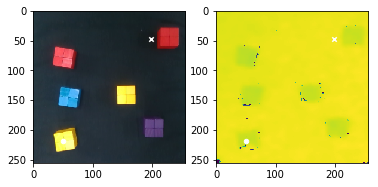

start pix : (50,219,678.859375) -> goal pix : (198,47,725.0)
start pixel        goal pixek
x : 50.000000    x : 198.000000
y : 219.000000    y : 47.000000
z : 678.859375    z : 725.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.881097    x : 0.597403
y : -0.112265    y : 0.124919
z : -0.201498    z : -0.186555
x : -0.062815    x : 0.711139
y : 0.994465    y : -0.696627
z : 0.016917    z : -0.019038
w : 0.082504    w : -0.092899


-----------data 14----------


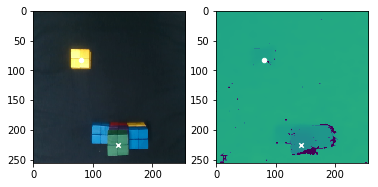

start pix : (80,82,686.0) -> goal pix : (142,226,583.7109375)
start pixel        goal pixek
x : 80.000000    x : 142.000000
y : 82.000000    y : 226.000000
z : 686.000000    z : 583.710937
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.648572    x : 0.874677
y : -0.069351    y : 0.032965
z : -0.204124    z : -0.048069
x : 0.024894    x : 0.007229
y : 0.997549    y : 0.995029
z : -0.011380    z : -0.002933
w : 0.064397    w : 0.099280


-----------data 15----------


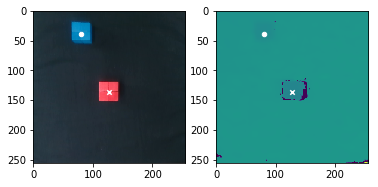

start pix : (80,38,673.0) -> goal pix : (127,137,629.3984375)
start pixel        goal pixek
x : 80.000000    x : 127.000000
y : 38.000000    y : 137.000000
z : 673.000000    z : 629.398438
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.575593    x : 0.745121
y : -0.071569    y : 0.003901
z : -0.205459    z : -0.101011
x : 0.045516    x : 0.036831
y : 0.998062    y : 0.996707
z : -0.011599    z : 0.033152
w : 0.040808    w : 0.064189


-----------data 16----------


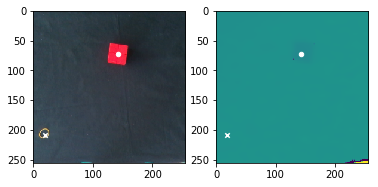

start pix : (142,73,676.0) -> goal pix : (19,208,722.4453125)
start pixel        goal pixek
x : 142.000000    x : 19.000000
y : 73.000000    y : 208.000000
z : 676.000000    z : 722.445312
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.624417    x : 0.856450
y : 0.037286    y : -0.190068
z : -0.215833    z : -0.223209
x : 0.029338    x : -0.097419
y : 0.999186    y : 0.990576
z : 0.008600    z : -0.033416
w : 0.026320    w : 0.090294


-----------data 17----------


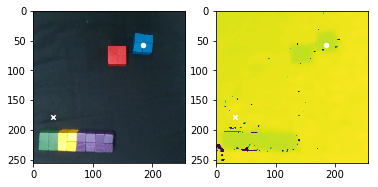

start pix : (185,57,674.8515625) -> goal pix : (32,179,720.0)
start pixel        goal pixek
x : 185.000000    x : 32.000000
y : 57.000000    y : 179.000000
z : 674.851562    z : 720.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.600789    x : 0.823372
y : 0.110967    y : -0.150826
z : -0.195067    z : -0.189237
x : 0.043815    x : 0.007155
y : 0.997249    y : 0.995477
z : 0.020827    z : 0.029585
w : 0.056051    w : 0.089994


-----------data 18----------


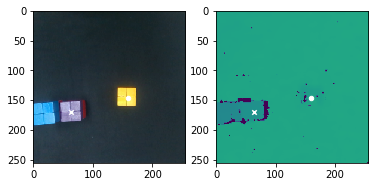

start pix : (159,147,715.2265625) -> goal pix : (63,170,630.0)
start pixel        goal pixek
x : 159.000000    x : 63.000000
y : 147.000000    y : 170.000000
z : 715.226562    z : 630.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.759816    x : 0.772650
y : 0.052225    y : -0.081221
z : -0.206643    z : -0.106008
x : -0.015734    x : 0.745193
y : 0.992531    y : -0.660364
z : -0.019955    z : -0.066066
w : 0.119318    w : -0.065129


-----------data 19----------


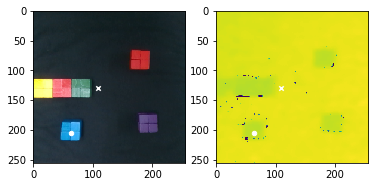

start pix : (63,205,678.5390625) -> goal pix : (109,130,721.0)
start pixel        goal pixek
x : 63.000000    x : 109.000000
y : 205.000000    y : 130.000000
z : 678.539062    z : 721.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.851543    x : 0.727482
y : -0.095186    y : -0.006704
z : -0.201675    z : -0.197440
x : 0.006800    x : -0.694445
y : 0.988086    y : 0.702705
z : -0.016054    z : 0.062307
w : 0.152912    w : 0.141671


-----------data 20----------


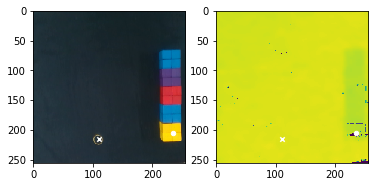

start pix : (235,206,680.859375) -> goal pix : (110,216,728.0)
start pixel        goal pixek
x : 235.000000    x : 110.000000
y : 206.000000    y : 216.000000
z : 680.859375    z : 728.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.879659    x : 0.900548
y : 0.181875    y : -0.033152
z : -0.204031    z : -0.201828
x : -0.017890    x : -0.043767
y : 0.967237    y : 0.965762
z : -0.002991    z : -0.009265
w : 0.253228    w : 0.255543


-----------data 21----------


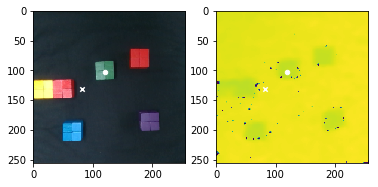

start pix : (120,102,676.0) -> goal pix : (82,131,721.011901855)
start pixel        goal pixek
x : 120.000000    x : 82.000000
y : 102.000000    y : 131.000000
z : 676.000000    z : 721.011902
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.694958    x : 0.734424
y : 0.003865    y : -0.040594
z : -0.188692    z : -0.178511
x : -0.052555    x : -0.693714
y : 0.990597    y : 0.707244
z : -0.042063    z : 0.069901
w : 0.119104    w : 0.116963


-----------data 22----------


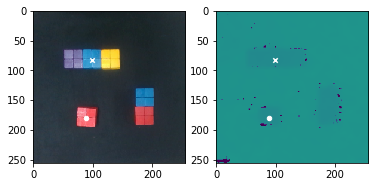

start pix : (89,180,676.6484375) -> goal pix : (99,82,673.0)
start pixel        goal pixek
x : 89.000000    x : 99.000000
y : 180.000000    y : 82.000000
z : 676.648438    z : 673.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.804803    x : 0.646331
y : -0.066353    y : -0.049083
z : -0.208848    z : -0.150263
x : 0.067897    x : 0.004046
y : 0.991148    y : 0.993188
z : -0.024745    z : -0.020691
w : 0.111368    w : 0.114596


-----------data 23----------


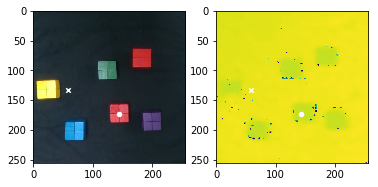

start pix : (143,173,680.0) -> goal pix : (58,133,718.328125)
start pixel        goal pixek
x : 143.000000    x : 58.000000
y : 173.000000    y : 133.000000
z : 680.000000    z : 718.328125
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.823349    x : 0.728239
y : 0.032330    y : -0.136735
z : -0.198601    z : -0.192878
x : -0.006669    x : 0.675118
y : 0.986446    y : 0.714807
z : 0.018753    z : -0.110625
w : 0.162875    w : 0.145011


-----------data 24----------


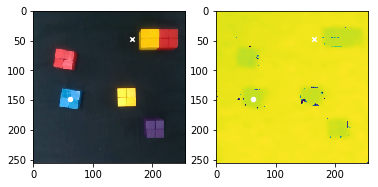

start pix : (62,149,673.0) -> goal pix : (165,48,725.0)
start pixel        goal pixek
x : 62.000000    x : 165.000000
y : 149.000000    y : 48.000000
z : 673.000000    z : 725.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.767468    x : 0.594028
y : -0.103539    y : 0.087907
z : -0.203177    z : -0.193014
x : 0.053263    x : -0.675424
y : 0.988025    y : 0.717066
z : -0.022545    z : 0.053302
w : 0.143044    w : 0.163639


-----------data 25----------


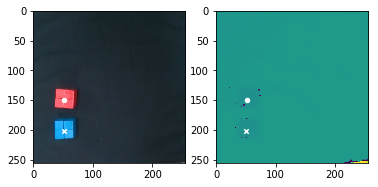

start pix : (52,150,676.0) -> goal pix : (51,202,679.9453125)
start pixel        goal pixek
x : 52.000000    x : 51.000000
y : 150.000000    y : 202.000000
z : 676.000000    z : 679.945312
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.772116    x : 0.856303
y : -0.128259    y : -0.134217
z : -0.200718    z : -0.147355
x : 0.027619    x : -0.030652
y : 0.987444    y : 0.985190
z : -0.053116    z : -0.072426
w : 0.146182    w : 0.152369


-----------data 26----------


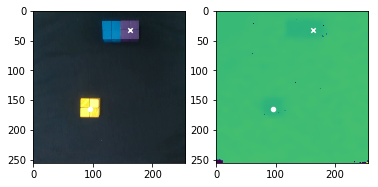

start pix : (95,165,678.2578125) -> goal pix : (163,32,678.0)
start pixel        goal pixek
x : 95.000000    x : 163.000000
y : 165.000000    y : 32.000000
z : 678.257812    z : 678.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.784973    x : 0.575776
y : -0.055674    y : 0.059329
z : -0.207834    z : -0.159457
x : -0.007550    x : 0.008285
y : 0.990524    y : 0.990411
z : -0.043553    z : -0.019384
w : 0.130030    w : 0.136534


-----------data 27----------


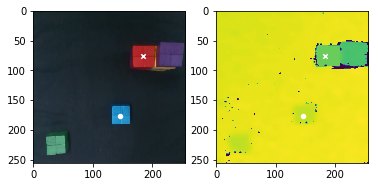

start pix : (146,177,676.0) -> goal pix : (184,76,577.0)
start pixel        goal pixek
x : 146.000000    x : 184.000000
y : 177.000000    y : 76.000000
z : 676.000000    z : 577.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.813907    x : 0.656975
y : 0.052729    y : 0.105538
z : -0.187568    z : -0.031490
x : -0.020781    x : -0.687425
y : 0.991635    y : 0.714434
z : 0.040584    z : 0.098556
w : 0.120754    w : 0.085541


-----------data 28----------


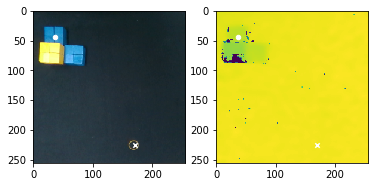

start pix : (36,44,666.6796875) -> goal pix : (170,225,724.2265625)
start pixel        goal pixek
x : 36.000000    x : 170.000000
y : 44.000000    y : 225.000000
z : 666.679688    z : 724.226562
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.569893    x : 0.896851
y : -0.142214    y : 0.074371
z : -0.202826    z : -0.192807
x : 0.012136    x : -0.024004
y : 0.999467    y : 0.986616
z : -0.007899    z : 0.012392
w : 0.029251    w : 0.160809


-----------data 29----------


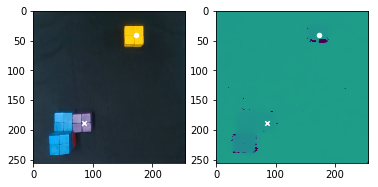

start pix : (173,41,681.0) -> goal pix : (85,188,681.0)
start pixel        goal pixek
x : 173.000000    x : 85.000000
y : 41.000000    y : 188.000000
z : 681.000000    z : 681.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.583880    x : 0.824051
y : 0.083024    y : -0.075837
z : -0.207276    z : -0.157082
x : -0.015205    x : -0.026729
y : 0.994654    y : 0.991605
z : -0.018005    z : -0.031389
w : 0.100540    w : 0.122552


-----------data 30----------


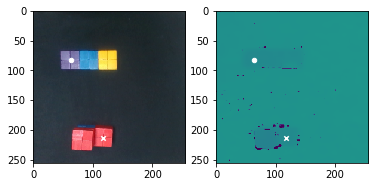

start pix : (63,83,671.4453125) -> goal pix : (117,214,674.0)
start pixel        goal pixek
x : 63.000000    x : 117.000000
y : 83.000000    y : 214.000000
z : 671.445312    z : 674.000000
o : 1.000000    o : 1.000000


start pose        goal pose
x : 0.635121    x : 0.857647
y : -0.099332    y : -0.008508
z : -0.196202    z : -0.145730
x : -0.705880    x : -0.684661
y : 0.708148    y : 0.724833
z : -0.015937    z : -0.048517
w : 0.002576    w : 0.059176


-----------data 31----------


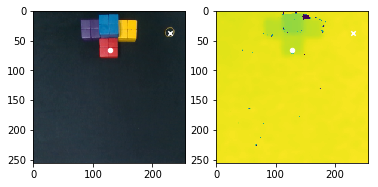

start pix : (128,65,675.7578125) -> goal pix : (230,37,731.6484375)
start pixel        goal pixek
x : 128.000000    x : 230.000000
y : 65.000000    y : 37.000000
z : 675.757812    z : 731.648438
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.617248    x : 0.569732
y : 0.006425    y : 0.185185
z : -0.202886    z : -0.195022
x : 0.018878    x : -0.005035
y : 0.996834    y : 0.996137
z : -0.059522    z : -0.026958
w : 0.049230    w : 0.083416


-----------data 32----------


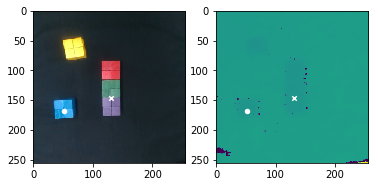

start pix : (52,168,678.0) -> goal pix : (131,147,677.390625)
start pixel        goal pixek
x : 52.000000    x : 131.000000
y : 168.000000    y : 147.000000
z : 678.000000    z : 677.390625
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.797686    x : 0.771734
y : -0.121639    y : 0.015313
z : -0.198465    z : -0.143985
x : -0.027642    x : -0.004070
y : 0.992219    y : 0.990878
z : -0.016726    z : -0.015149
w : 0.120242    w : 0.133849


-----------data 33----------


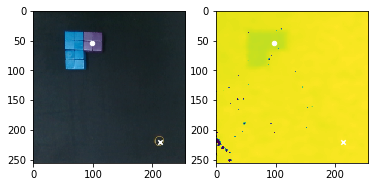

start pix : (98,54,673.0) -> goal pix : (213,221,730.830627441)
start pixel        goal pixek
x : 98.000000    x : 213.000000
y : 54.000000    y : 221.000000
z : 673.000000    z : 730.830627
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.582768    x : 0.876452
y : -0.040798    y : 0.163852
z : -0.208952    z : -0.196841
x : -0.682408    x : -0.041945
y : 0.730582    y : 0.970851
z : -0.020749    z : 0.009318
w : -0.011789    w : 0.235800


-----------data 34----------


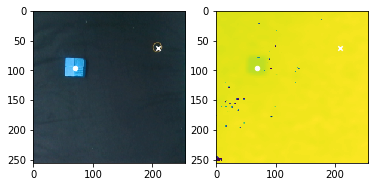

start pix : (69,96,668.0) -> goal pix : (209,62,730.953125)
start pixel        goal pixek
x : 69.000000    x : 209.000000
y : 96.000000    y : 62.000000
z : 668.000000    z : 730.953125
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.678319    x : 0.619986
y : -0.078612    y : 0.163116
z : -0.193171    z : -0.185219
x : 0.024405    x : -0.000535
y : 0.996132    y : 0.993845
z : -0.001437    z : 0.015393
w : 0.084399    w : 0.109701


-----------data 35----------


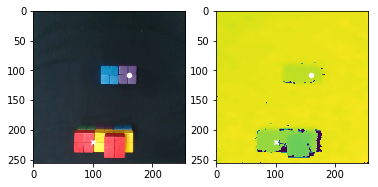

start pix : (160,107,676.140625) -> goal pix : (100,221,633.0)
start pixel        goal pixek
x : 160.000000    x : 100.000000
y : 107.000000    y : 221.000000
z : 676.140625    z : 633.000000
o : 1.000000    o : 1.000000


start pose        goal pose
x : 0.694253    x : 0.870782
y : 0.051881    y : -0.029285
z : -0.203812    z : -0.094113
x : 0.677168    x : -0.702113
y : 0.724898    y : 0.706183
z : -0.027564    z : 0.010778
w : 0.123316    w : 0.090706


-----------data 36----------


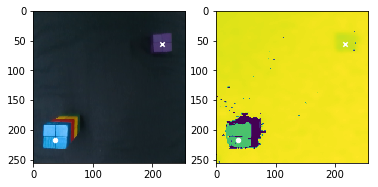

start pix : (37,217,528.0) -> goal pix : (217,56,683.0)
start pixel        goal pixek
x : 37.000000    x : 217.000000
y : 217.000000    y : 56.000000
z : 528.000000    z : 683.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.848482    x : 0.629459
y : -0.102915    y : 0.165310
z : -0.042717    z : -0.130964
x : 0.001878    x : -0.041310
y : 0.983251    y : 0.981773
z : -0.029117    z : 0.003799
w : 0.179906    w : 0.185472


-----------data 37----------


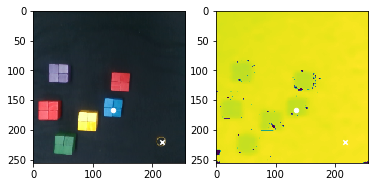

start pix : (134,166,680.0) -> goal pix : (217,220,739.609375)
start pixel        goal pixek
x : 134.000000    x : 217.000000
y : 166.000000    y : 220.000000
z : 680.000000    z : 739.609375
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.785116    x : 0.894167
y : 0.027965    y : 0.168074
z : -0.206530    z : -0.196032
x : 0.023860    x : -0.040187
y : 0.992873    y : 0.967621
z : 0.008112    z : 0.014341
w : 0.116486    w : 0.248774


-----------data 38----------


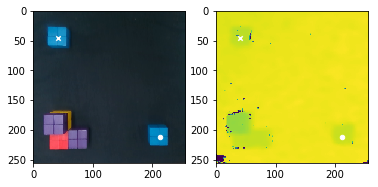

start pix : (212,212,681.0) -> goal pix : (41,45,668.0)
start pixel        goal pixek
x : 212.000000    x : 41.000000
y : 212.000000    y : 45.000000
z : 681.000000    z : 668.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.884976    x : 0.591903
y : 0.145506    y : -0.138123
z : -0.211179    z : -0.159421
x : -0.040820    x : 0.009179
y : 0.971267    y : 0.998120
z : -0.002651    z : -0.031042
w : 0.234452    w : 0.052040


-----------data 39----------


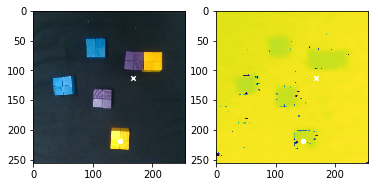

start pix : (146,219,693.9609375) -> goal pix : (168,113,725.0)
start pixel        goal pixek
x : 146.000000    x : 168.000000
y : 219.000000    y : 113.000000
z : 693.960937    z : 725.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.887842    x : 0.713869
y : 0.044593    y : 0.085782
z : -0.196340    z : -0.192032
x : -0.003210    x : -0.012000
y : 0.990709    y : 0.994339
z : 0.006639    z : 0.040971
w : 0.135797    w : 0.097305


-----------data 40----------


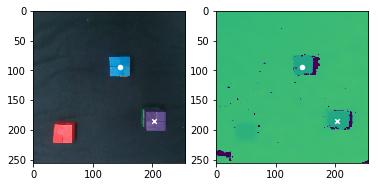

start pix : (145,94,622.5234375) -> goal pix : (203,185,631.485656738)
start pixel        goal pixek
x : 145.000000    x : 203.000000
y : 94.000000    y : 185.000000
z : 622.523438    z : 631.485657
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.691171    x : 0.844321
y : 0.040748    y : 0.134824
z : -0.148646    z : -0.086460
x : -0.012760    x : 0.011139
y : 0.992873    y : 0.989161
z : 0.030715    z : 0.027137
w : 0.114440    w : 0.143873


-----------data 41----------


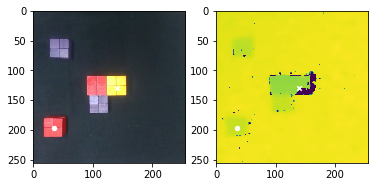

start pix : (35,197,676.0) -> goal pix : (140,129,631.069641113)
start pixel        goal pixek
x : 35.000000    x : 140.000000
y : 197.000000    y : 129.000000
z : 676.000000    z : 631.069641
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.848452    x : 0.745863
y : -0.146053    y : 0.024833
z : -0.195729    z : -0.082676
x : 0.006818    x : -0.022926
y : 0.986100    y : 0.989054
z : -0.014421    z : -0.018981
w : 0.165386    w : 0.144520


-----------data 42----------


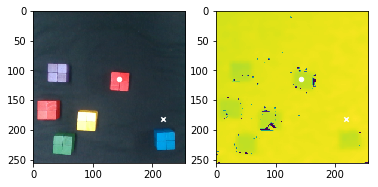

start pix : (143,115,675.9453125) -> goal pix : (218,182,735.666931152)
start pixel        goal pixek
x : 143.000000    x : 218.000000
y : 115.000000    y : 182.000000
z : 675.945312    z : 735.666931
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.716073    x : 0.833837
y : 0.045350    y : 0.175184
z : -0.202191    z : -0.199971
x : -0.007049    x : -0.047795
y : 0.991262    y : 0.979411
z : -0.011954    z : 0.015393
w : 0.131174    w : 0.195532


-----------data 43----------


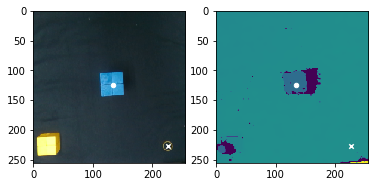

start pix : (134,125,526.0) -> goal pix : (227,228,730.812438965)
start pixel        goal pixek
x : 134.000000    x : 227.000000
y : 125.000000    y : 228.000000
z : 526.000000    z : 730.812439
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.735269    x : 0.921819
y : 0.016805    y : 0.177397
z : -0.049533    z : -0.179028
x : -0.067530    x : -0.101616
y : 0.993448    y : 0.955596
z : 0.007805    z : 0.051541
w : 0.091865    w : 0.271762


-----------data 44----------


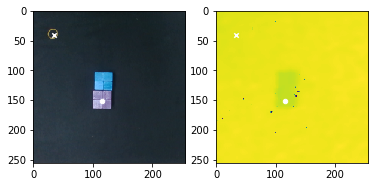

start pix : (116,151,678.0) -> goal pix : (34,40,707.0)
start pixel        goal pixek
x : 116.000000    x : 34.000000
y : 151.000000    y : 40.000000
z : 678.000000    z : 707.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.765094    x : 0.570292
y : -0.006297    y : -0.149676
z : -0.197170    z : -0.187045
x : -0.040524    x : -0.068337
y : 0.993165    y : 0.993896
z : 0.005671    z : -0.011302
w : 0.109310    w : 0.085862


-----------data 45----------


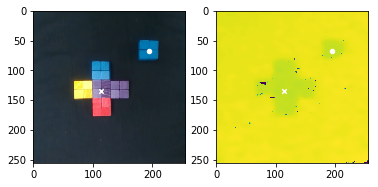

start pix : (195,67,678.0) -> goal pix : (114,134,677.93157959)
start pixel        goal pixek
x : 195.000000    x : 114.000000
y : 67.000000    y : 134.000000
z : 678.000000    z : 677.931580
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.631225    x : 0.741580
y : 0.113092    y : -0.027727
z : -0.205655    z : -0.150184
x : -0.032997    x : -0.032594
y : 0.988550    y : 0.988924
z : -0.037688    z : -0.041860
w : 0.142336    w : 0.138616


-----------data 46----------


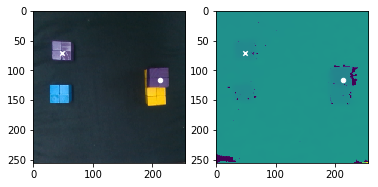

start pix : (213,117,634.464416504) -> goal pix : (48,70,665.5078125)
start pixel        goal pixek
x : 213.000000    x : 48.000000
y : 117.000000    y : 70.000000
z : 634.464417    z : 665.507812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.713232    x : 0.633045
y : 0.134801    y : -0.124409
z : -0.152919    z : -0.141417
x : -0.025145    x : 0.006546
y : 0.994640    y : 0.996994
z : -0.017787    z : -0.034649
w : 0.098702    w : 0.068985


-----------data 47----------


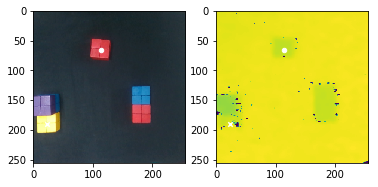

start pix : (114,66,673.2109375) -> goal pix : (23,191,712.0)
start pixel        goal pixek
x : 114.000000    x : 23.000000
y : 66.000000    y : 191.000000
z : 673.210937    z : 712.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.619319    x : 0.822317
y : -0.027582    y : -0.174092
z : -0.199481    z : -0.144640
x : 0.066733    x : -0.007706
y : 0.993358    y : 0.999147
z : -0.041647    z : -0.026377
w : 0.083972    w : 0.030829


-----------data 48----------


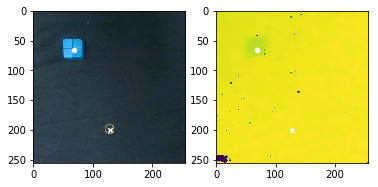

start pix : (68,65,666.0) -> goal pix : (128,200,725.270568848)
start pixel        goal pixek
x : 68.000000    x : 128.000000
y : 65.000000    y : 200.000000
z : 666.000000    z : 725.270569
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.622869    x : 0.854473
y : -0.083105    y : 0.015364
z : -0.191329    z : -0.186917
x : -0.012009    x : -0.001959
y : 0.997987    y : 0.995962
z : 0.036447    z : 0.023986
w : 0.050483    w : 0.086490


-----------data 49----------


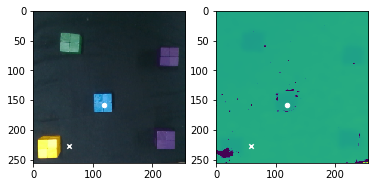

start pix : (119,159,673.0) -> goal pix : (59,227,729.8203125)
start pixel        goal pixek
x : 119.000000    x : 59.000000
y : 159.000000    y : 227.000000
z : 673.000000    z : 729.820312
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.780328    x : 0.909399
y : -0.004061    y : -0.098765
z : -0.195548    z : -0.189339
x : -0.043378    x : 0.702163
y : 0.997269    y : -0.696622
z : -0.002509    z : 0.022511
w : 0.059716    w : -0.145527


-----------data 50----------


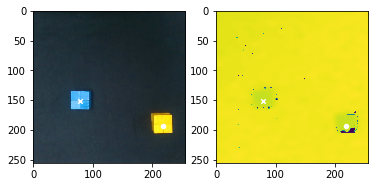

start pix : (218,194,680.0) -> goal pix : (79,152,675.0)
start pixel        goal pixek
x : 218.000000    x : 79.000000
y : 194.000000    y : 152.000000
z : 680.000000    z : 675.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.840060    x : 0.774070
y : 0.154982    y : -0.075660
z : -0.205485    z : -0.140333
x : -0.036925    x : 0.008007
y : 0.983990    y : 0.980221
z : 0.052722    z : 0.019713
w : 0.166195    w : 0.196757


-----------data 51----------


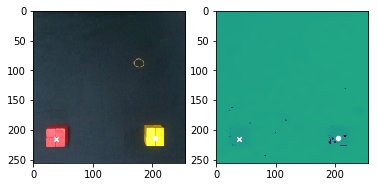

start pix : (205,214,682.203125) -> goal pix : (38,215,679.265625)
start pixel        goal pixek
x : 205.000000    x : 38.000000
y : 214.000000    y : 215.000000
z : 682.203125    z : 679.265625
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.881988    x : 0.869014
y : 0.141041    y : -0.141743
z : -0.198619    z : -0.150956
x : -0.017688    x : 0.003683
y : 0.977748    y : 0.976176
z : 0.025769    z : -0.029461
w : 0.207442    w : 0.214938


-----------data 52----------


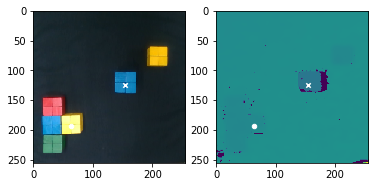

start pix : (63,193,683.0) -> goal pix : (154,125,578.0)
start pixel        goal pixek
x : 63.000000    x : 154.000000
y : 193.000000    y : 125.000000
z : 683.000000    z : 578.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.843169    x : 0.730905
y : -0.093302    y : 0.047215
z : -0.194525    z : -0.037717
x : 0.728686    x : 0.010015
y : -0.677066    y : 0.995165
z : -0.007405    z : -0.041275
w : -0.102683    w : 0.088556


-----------data 53----------


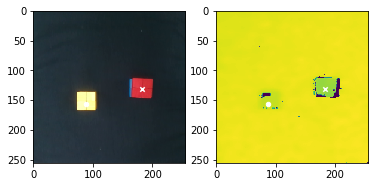

start pix : (88,156,680.0) -> goal pix : (183,132,633.0)
start pixel        goal pixek
x : 88.000000    x : 183.000000
y : 156.000000    y : 132.000000
z : 680.000000    z : 633.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.776611    x : 0.750959
y : -0.053927    y : 0.087070
z : -0.194353    z : -0.085325
x : -0.012567    x : 0.015270
y : 0.993119    y : 0.986799
z : -0.008974    z : -0.017159
w : 0.116088    w : 0.160315


-----------data 54----------


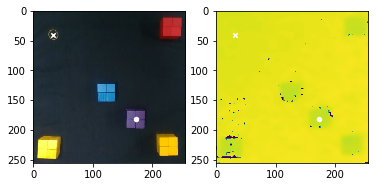

start pix : (173,182,678.3984375) -> goal pix : (32,41,708.8984375)
start pixel        goal pixek
x : 173.000000    x : 32.000000
y : 182.000000    y : 41.000000
z : 678.398438    z : 708.898438
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.843424    x : 0.584152
y : 0.080175    y : -0.144600
z : -0.213770    z : -0.198955
x : -0.020646    x : 0.026989
y : 0.983953    y : 0.987817
z : -0.015896    z : -0.023342
w : 0.176517    w : 0.151475


-----------data 55----------


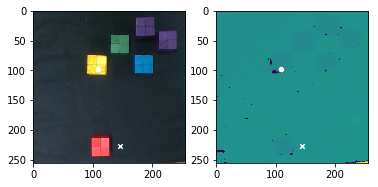

start pix : (109,98,694.956176758) -> goal pix : (145,228,730.3203125)
start pixel        goal pixek
x : 109.000000    x : 145.000000
y : 98.000000    y : 228.000000
z : 694.956177    z : 730.320313
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.676514    x : 0.900601
y : -0.015641    y : 0.052155
z : -0.194028    z : -0.184364
x : -0.007130    x : 0.708846
y : 0.998345    y : -0.687053
z : 0.024555    z : 0.039022
w : 0.051520    w : -0.154833


-----------data 56----------


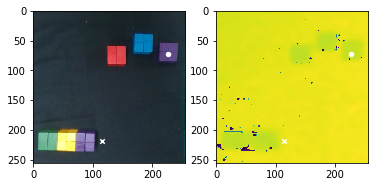

start pix : (227,73,680.1953125) -> goal pix : (115,218,722.9453125)
start pixel        goal pixek
x : 227.000000    x : 115.000000
y : 73.000000    y : 218.000000
z : 680.195312    z : 722.945313
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.629933    x : 0.877508
y : 0.191996    y : 0.007535
z : -0.183803    z : -0.178876
x : -0.012708    x : -0.697711
y : 0.996825    y : 0.700942
z : 0.053789    z : -0.015891
w : 0.057320    w : 0.147061


-----------data 57----------


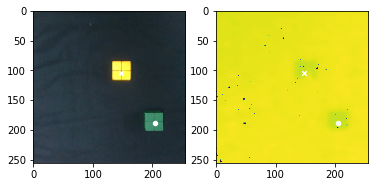

start pix : (205,189,680.7890625) -> goal pix : (148,104,689.953125)
start pixel        goal pixek
x : 205.000000    x : 148.000000
y : 189.000000    y : 104.000000
z : 680.789062    z : 689.953125
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.838996    x : 0.697038
y : 0.134905    y : 0.037588
z : -0.200897    z : -0.145323
x : -0.031964    x : 0.007162
y : 0.982340    y : 0.985261
z : 0.011034    z : -0.003636
w : 0.184022    w : 0.170866


-----------data 58----------


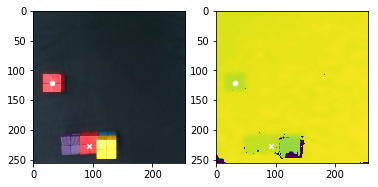

start pix : (31,122,675.6640625) -> goal pix : (93,228,681.6796875)
start pixel        goal pixek
x : 31.000000    x : 93.000000
y : 122.000000    y : 228.000000
z : 675.664062    z : 681.679687
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.724972    x : 0.893149
y : -0.154949    y : -0.046129
z : -0.215562    z : -0.157082
x : -0.016945    x : 0.710048
y : 0.992147    y : -0.690310
z : -0.023614    z : -0.001365
w : 0.121655    w : -0.138931


-----------data 59----------


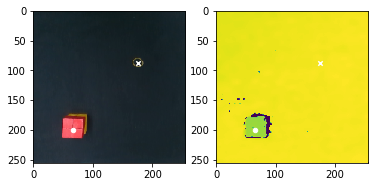

start pix : (66,200,626.7890625) -> goal pix : (175,88,724.0)
start pixel        goal pixek
x : 66.000000    x : 175.000000
y : 200.000000    y : 88.000000
z : 626.789062    z : 724.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.831481    x : 0.650435
y : -0.080783    y : 0.095847
z : -0.154481    z : -0.199393
x : 0.030923    x : 0.012639
y : 0.999074    y : 0.999310
z : -0.008014    z : -0.034187
w : 0.028839    w : 0.007199


-----------data 60----------


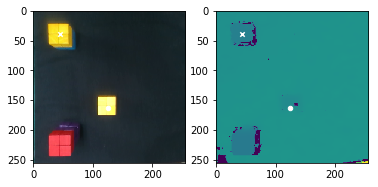

start pix : (125,163,690.878540039) -> goal pix : (44,39,614.386169434)
start pixel        goal pixek
x : 125.000000    x : 44.000000
y : 163.000000    y : 39.000000
z : 690.878540    z : 614.386169
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.796830    x : 0.609772
y : -0.005555    y : -0.118623
z : -0.201901    z : -0.086743
x : -0.015448    x : -0.004636
y : 0.986137    y : 0.988951
z : 0.030195    z : 0.011697
w : 0.162433    w : 0.147709


-----------data 61----------


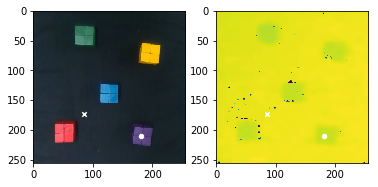

start pix : (181,210,679.878356934) -> goal pix : (85,173,719.4140625)
start pixel        goal pixek
x : 181.000000    x : 85.000000
y : 210.000000    y : 173.000000
z : 679.878357    z : 719.414062
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.882718    x : 0.823366
y : 0.109240    y : -0.048987
z : -0.209262    z : -0.195473
x : 0.016556    x : -0.005287
y : 0.975297    y : 0.972121
z : 0.013528    z : -0.004852
w : 0.219861    w : 0.234370


-----------data 62----------


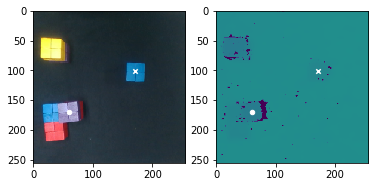

start pix : (60,170,623.0) -> goal pix : (171,101,678.0)
start pixel        goal pixek
x : 60.000000    x : 171.000000
y : 170.000000    y : 101.000000
z : 623.000000    z : 678.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.785352    x : 0.679068
y : -0.092542    y : 0.079258
z : -0.162106    z : -0.159576
x : -0.028916    x : 0.019138
y : 0.993109    y : 0.997790
z : -0.024795    z : -0.032547
w : 0.110831    w : 0.054672


-----------data 63----------


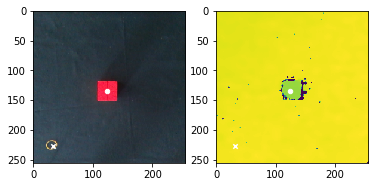

start pix : (124,135,620.0) -> goal pix : (32,228,730.0)
start pixel        goal pixek
x : 124.000000    x : 32.000000
y : 135.000000    y : 228.000000
z : 620.000000    z : 730.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.745284    x : 0.904373
y : 0.004848    y : -0.169458
z : -0.155277    z : -0.208677
x : 0.010656    x : -0.032166
y : 0.995502    y : 0.990066
z : -0.026092    z : -0.060911
w : 0.090446    w : 0.122571


-----------data 64----------


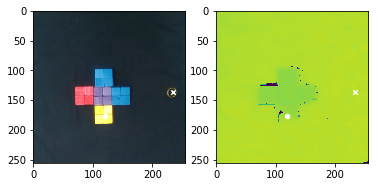

start pix : (120,176,704.788024902) -> goal pix : (234,137,734.5859375)
start pixel        goal pixek
x : 120.000000    x : 234.000000
y : 176.000000    y : 137.000000
z : 704.788025    z : 734.585938
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.799357    x : 0.746070
y : -0.015513    y : 0.187851
z : -0.207526    z : -0.198957
x : -0.010832    x : -0.055043
y : 0.994157    y : 0.990126
z : -0.016211    z : -0.007087
w : 0.106164    w : 0.128725


-----------data 65----------


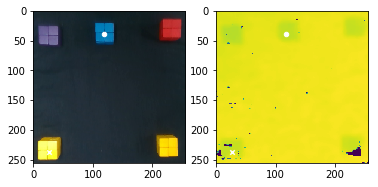

start pix : (118,39,673.0) -> goal pix : (26,237,687.143432617)
start pixel        goal pixek
x : 118.000000    x : 26.000000
y : 39.000000    y : 237.000000
z : 673.000000    z : 687.143433
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.591725    x : 0.915688
y : 0.001417    y : -0.160512
z : -0.201436    z : -0.147514
x : -0.010965    x : 0.001806
y : 0.994963    y : 0.989772
z : -0.014985    z : -0.004463
w : 0.098504    w : 0.142574


-----------data 66----------


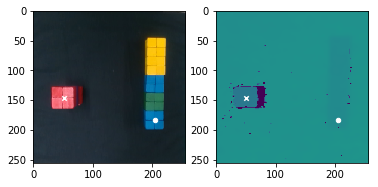

start pix : (205,184,681.0) -> goal pix : (51,147,575.0)
start pixel        goal pixek
x : 205.000000    x : 51.000000
y : 184.000000    y : 147.000000
z : 681.000000    z : 575.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.835414    x : 0.770175
y : 0.157336    y : -0.084731
z : -0.208619    z : -0.047569
x : 0.004000    x : -0.013319
y : 0.983188    y : 0.982985
z : 0.056452    z : -0.015078
w : 0.173604    w : 0.182578


-----------data 67----------


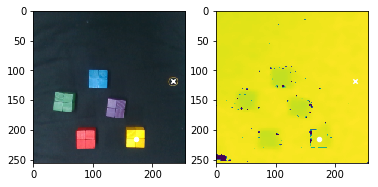

start pix : (173,215,707.0) -> goal pix : (234,118,730.0)
start pixel        goal pixek
x : 173.000000    x : 234.000000
y : 215.000000    y : 118.000000
z : 707.000000    z : 730.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.891741    x : 0.727401
y : 0.081372    y : 0.201938
z : -0.193560    z : -0.177191
x : -0.009127    x : -0.028490
y : 0.978344    y : 0.984710
z : -0.005379    z : 0.024947
w : 0.206713    w : 0.170039


-----------data 68----------


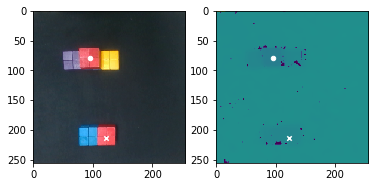

start pix : (95,80,630.0) -> goal pix : (122,214,681.965881348)
start pixel        goal pixek
x : 95.000000    x : 122.000000
y : 80.000000    y : 214.000000
z : 630.000000    z : 681.965881
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.636541    x : 0.848044
y : -0.045246    y : -0.063285
z : -0.152541    z : -0.153489
x : 0.035131    x : 0.032828
y : 0.997255    y : 0.997932
z : -0.036554    z : -0.022936
w : 0.053964    w : 0.050272


-----------data 69----------


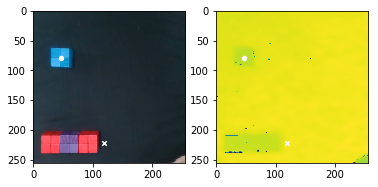

start pix : (47,79,665.0) -> goal pix : (119,223,729.0)
start pixel        goal pixek
x : 47.000000    x : 119.000000
y : 79.000000    y : 223.000000
z : 665.000000    z : 729.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.658720    x : 0.903948
y : -0.128302    y : 0.013477
z : -0.202083    z : -0.193039
x : -0.030448    x : 0.715342
y : 0.992298    y : -0.677940
z : -0.015093    z : 0.022644
w : 0.119120    w : -0.167839


-----------data 70----------


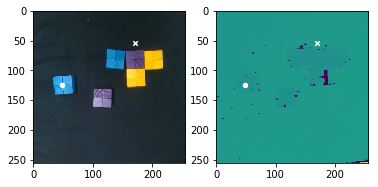

start pix : (48,124,675.0) -> goal pix : (170,54,726.5859375)
start pixel        goal pixek
x : 48.000000    x : 170.000000
y : 124.000000    y : 54.000000
z : 675.000000    z : 726.585938
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.723295    x : 0.605463
y : -0.116017    y : 0.082438
z : -0.197221    z : -0.187142
x : -0.062373    x : -0.039834
y : 0.996137    y : 0.997403
z : -0.019366    z : -0.005204
w : 0.058698    w : 0.059785


-----------data 71----------


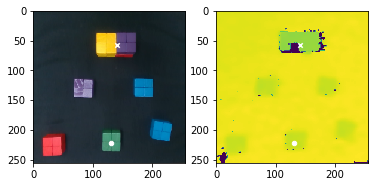

start pix : (131,222,678.0) -> goal pix : (141,58,620.0)
start pixel        goal pixek
x : 131.000000    x : 141.000000
y : 222.000000    y : 58.000000
z : 678.000000    z : 620.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.898056    x : 0.636997
y : 0.016962    y : 0.033062
z : -0.208604    z : -0.091410
x : -0.027592    x : -0.024658
y : 0.978728    y : 0.979984
z : 0.005071    z : 0.001792
w : 0.203236    w : 0.197535


-----------data 72----------


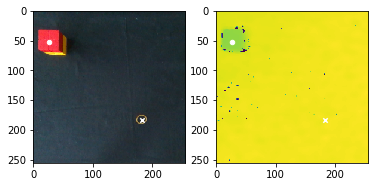

start pix : (26,53,616.0) -> goal pix : (183,183,725.0)
start pixel        goal pixek
x : 26.000000    x : 183.000000
y : 53.000000    y : 183.000000
z : 616.000000    z : 725.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.593914    x : 0.839935
y : -0.143938    y : 0.096152
z : -0.154677    z : -0.202399
x : 0.081408    x : -0.061139
y : 0.995995    y : 0.985907
z : 0.009867    z : -0.018126
w : -0.035618    w : 0.154663


-----------data 73----------


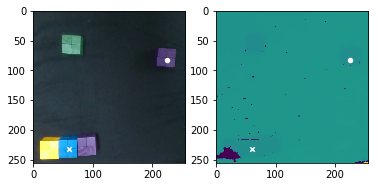

start pix : (225,82,678.0) -> goal pix : (60,233,678.1015625)
start pixel        goal pixek
x : 225.000000    x : 60.000000
y : 82.000000    y : 233.000000
z : 678.000000    z : 678.101562
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.650902    x : 0.898064
y : 0.166340    y : -0.110021
z : -0.211282    z : -0.160872
x : -0.071200    x : -0.054831
y : 0.993888    y : 0.992427
z : 0.028005    z : -0.000058
w : 0.079583    w : 0.109921


-----------data 74----------


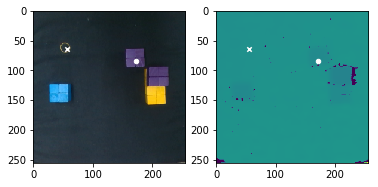

start pix : (172,84,677.0) -> goal pix : (56,64,711.6328125)
start pixel        goal pixek
x : 172.000000    x : 56.000000
y : 84.000000    y : 64.000000
z : 677.000000    z : 711.632812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.654258    x : 0.616451
y : 0.077480    y : -0.125043
z : -0.194593    z : -0.182754
x : -0.023872    x : -0.005321
y : 0.997788    y : 0.993508
z : 0.014681    z : -0.001897
w : 0.060282    w : 0.113622


-----------data 75----------


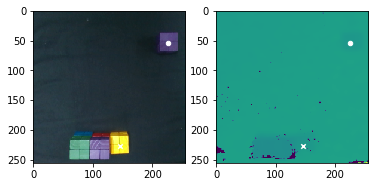

start pix : (226,54,678.0) -> goal pix : (146,227,686.0)
start pixel        goal pixek
x : 226.000000    x : 146.000000
y : 54.000000    y : 227.000000
z : 678.000000    z : 686.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.615535    x : 0.903029
y : 0.176878    y : 0.050378
z : -0.198054    z : -0.131864
x : -0.033317    x : 0.735387
y : 0.997228    y : -0.665216
z : -0.009279    z : 0.039486
w : 0.065884    w : -0.123018


-----------data 76----------


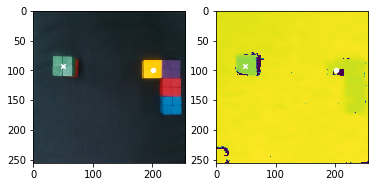

start pix : (201,100,690.0) -> goal pix : (49,93,623.0234375)
start pixel        goal pixek
x : 201.000000    x : 49.000000
y : 100.000000    y : 93.000000
z : 690.000000    z : 623.023438
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.690143    x : 0.686812
y : 0.139129    y : -0.115674
z : -0.192266    z : -0.082937
x : -0.654981    x : 0.048725
y : 0.749986    y : 0.993584
z : 0.025151    z : -0.050631
w : 0.088823    w : 0.088615


-----------data 77----------


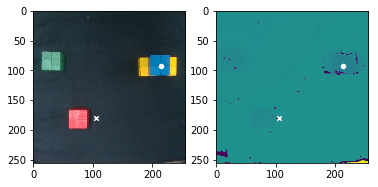

start pix : (214,93,628.0) -> goal pix : (105,180,725.0)
start pixel        goal pixek
x : 214.000000    x : 105.000000
y : 93.000000    y : 180.000000
z : 628.000000    z : 725.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.689036    x : 0.834733
y : 0.141372    y : -0.022102
z : -0.153639    z : -0.197556
x : -0.043504    x : -0.700013
y : 0.997055    y : 0.706683
z : -0.008119    z : 0.039040
w : 0.062636    w : 0.095167


-----------data 78----------


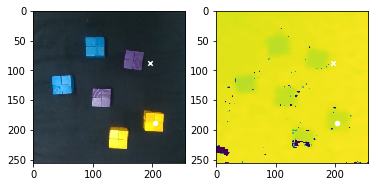

start pix : (204,189,695.578125) -> goal pix : (196,87,720.1796875)
start pixel        goal pixek
x : 204.000000    x : 196.000000
y : 189.000000    y : 87.000000
z : 695.578125    z : 720.179688
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.841207    x : 0.664131
y : 0.151727    y : 0.147939
z : -0.209703    z : -0.206591
x : -0.052232    x : -0.655077
y : 0.983603    y : 0.733554
z : 0.020213    z : 0.101971
w : 0.171428    w : 0.149580


-----------data 79----------


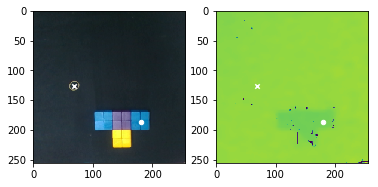

start pix : (180,187,681.0) -> goal pix : (68,126,725.0)
start pixel        goal pixek
x : 180.000000    x : 68.000000
y : 187.000000    y : 126.000000
z : 681.000000    z : 725.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.821805    x : 0.711337
y : 0.109138    y : -0.096601
z : -0.212487    z : -0.205894
x : 0.714374    x : -0.039049
y : -0.691171    y : 0.997055
z : -0.013748    z : -0.022471
w : -0.108459    w : 0.062067


-----------data 80----------


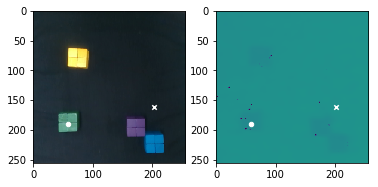

start pix : (58,191,681.0) -> goal pix : (202,161,730.0859375)
start pixel        goal pixek
x : 58.000000    x : 202.000000
y : 191.000000    y : 161.000000
z : 681.000000    z : 730.085938
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.833960    x : 0.800600
y : -0.097869    y : 0.135517
z : -0.202129    z : -0.196436
x : -0.016107    x : -0.040056
y : 0.990287    y : 0.985278
z : -0.017579    z : 0.013282
w : 0.136976    w : 0.165671


-----------data 81----------


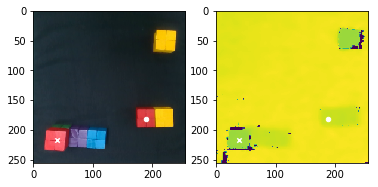

start pix : (189,181,681.0) -> goal pix : (39,217,633.0)
start pixel        goal pixek
x : 189.000000    x : 39.000000
y : 181.000000    y : 217.000000
z : 681.000000    z : 633.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.818615    x : 0.877801
y : 0.115701    y : -0.142721
z : -0.199722    z : -0.087230
x : 0.739115    x : 0.010300
y : -0.660407    y : 0.985091
z : -0.038014    z : -0.052028
w : -0.126992    w : 0.163655


-----------data 82----------


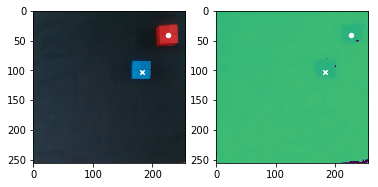

start pix : (227,40,680.1953125) -> goal pix : (183,102,679.0)
start pixel        goal pixek
x : 227.000000    x : 183.000000
y : 40.000000    y : 102.000000
z : 680.195312    z : 679.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.594301    x : 0.692330
y : 0.176676    y : 0.097032
z : -0.208338    z : -0.153836
x : -0.047245    x : 0.008212
y : 0.989908    y : 0.986160
z : -0.020298    z : -0.012510
w : 0.132054    w : 0.165118


-----------data 83----------


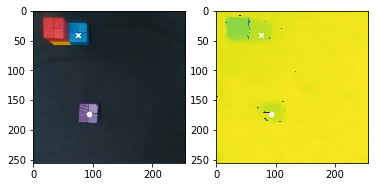

start pix : (93,174,686.234375) -> goal pix : (75,40,666.0)
start pixel        goal pixek
x : 93.000000    x : 75.000000
y : 174.000000    y : 40.000000
z : 686.234375    z : 666.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.807550    x : 0.579998
y : -0.051596    y : -0.083900
z : -0.211482    z : -0.150588
x : 0.704200    x : 0.712261
y : -0.703843    y : -0.699017
z : -0.014857    z : -0.010384
w : -0.092121    w : -0.062859


-----------data 84----------


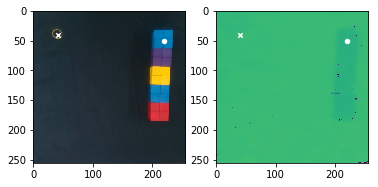

start pix : (220,51,681.0) -> goal pix : (41,41,714.203125)
start pixel        goal pixek
x : 220.000000    x : 41.000000
y : 51.000000    y : 41.000000
z : 681.000000    z : 714.203125
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.601650    x : 0.559576
y : 0.152233    y : -0.148586
z : -0.207535    z : -0.204883
x : 0.035674    x : 0.008711
y : 0.995229    y : 0.995928
z : -0.005289    z : -0.007464
w : 0.090651    w : 0.089421


-----------data 85----------


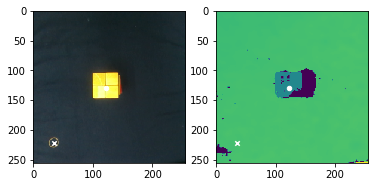

start pix : (122,129,480.0) -> goal pix : (35,222,729.377624512)
start pixel        goal pixek
x : 122.000000    x : 35.000000
y : 129.000000    y : 222.000000
z : 480.000000    z : 729.377625
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.738794    x : 0.897251
y : 0.009062    y : -0.159171
z : 0.001125    z : -0.197381
x : -0.031622    x : -0.033067
y : 0.996430    y : 0.990121
z : -0.000760    z : 0.018807
w : 0.078274    w : 0.134958


-----------data 86----------


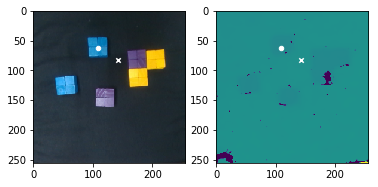

start pix : (109,63,671.0) -> goal pix : (142,83,726.0)
start pixel        goal pixek
x : 109.000000    x : 142.000000
y : 63.000000    y : 83.000000
z : 671.000000    z : 726.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.616544    x : 0.664093
y : -0.032993    y : 0.029498
z : -0.194323    z : -0.190290
x : -0.043258    x : 0.718257
y : 0.997387    y : -0.684651
z : -0.010148    z : 0.054418
w : 0.056973    w : -0.111346


-----------data 87----------


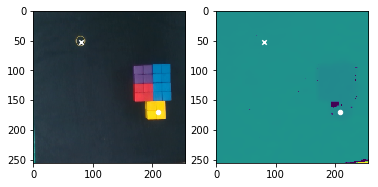

start pix : (209,170,682.0) -> goal pix : (80,52,721.558044434)
start pixel        goal pixek
x : 209.000000    x : 80.000000
y : 170.000000    y : 52.000000
z : 682.000000    z : 721.558044
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.806720    x : 0.592964
y : 0.139380    y : -0.085738
z : -0.205912    z : -0.200511
x : -0.037272    x : -0.015164
y : 0.986026    y : 0.990453
z : 0.017469    z : 0.007677
w : 0.161426    w : 0.136803


-----------data 88----------


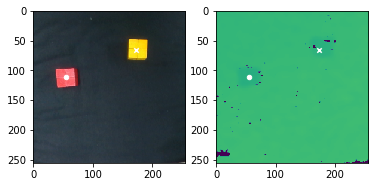

start pix : (55,112,667.043884277) -> goal pix : (173,66,677.0)
start pixel        goal pixek
x : 55.000000    x : 173.000000
y : 112.000000    y : 66.000000
z : 667.043884    z : 677.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.708852    x : 0.638969
y : -0.111907    y : 0.085867
z : -0.192688    z : -0.137745
x : -0.052394    x : 0.005880
y : 0.990809    y : 0.993208
z : 0.056558    z : 0.032817
w : 0.111147    w : 0.111475


-----------data 89----------


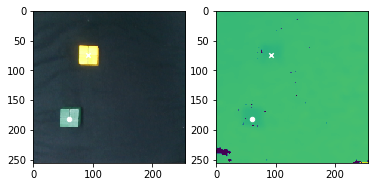

start pix : (60,181,676.364440918) -> goal pix : (92,75,681.0)
start pixel        goal pixek
x : 60.000000    x : 92.000000
y : 181.000000    y : 75.000000
z : 676.364441    z : 681.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.831925    x : 0.661350
y : -0.101596    y : -0.050915
z : -0.201472    z : -0.139620
x : 0.004829    x : 0.019344
y : 0.987802    y : 0.998387
z : -0.014469    z : -0.028344
w : 0.154963    w : 0.045233


-----------data 90----------


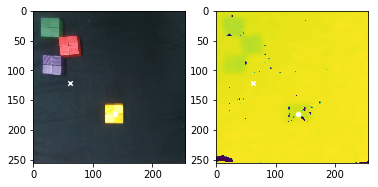

start pix : (137,174,694.5703125) -> goal pix : (62,122,725.0)
start pixel        goal pixek
x : 137.000000    x : 62.000000
y : 174.000000    y : 122.000000
z : 694.570312    z : 725.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.810810    x : 0.722022
y : 0.021772    y : -0.095378
z : -0.210376    z : -0.203385
x : -0.038628    x : -0.031788
y : 0.993154    y : 0.993837
z : -0.022869    z : -0.006931
w : 0.107847    w : 0.105965


-----------data 91----------


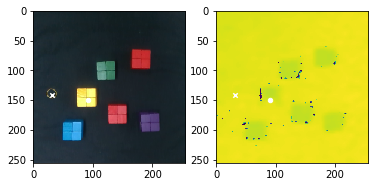

start pix : (91,150,699.881530762) -> goal pix : (31,142,715.0)
start pixel        goal pixek
x : 91.000000    x : 31.000000
y : 150.000000    y : 142.000000
z : 699.881531    z : 715.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.751505    x : 0.741908
y : -0.049111    y : -0.161869
z : -0.198493    z : -0.193056
x : 0.006029    x : -0.002985
y : 0.994571    y : 0.994604
z : -0.010856    z : -0.031071
w : 0.103315    w : 0.098941


-----------data 92----------


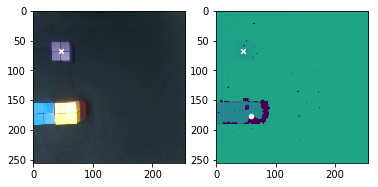

start pix : (59,176,578.0) -> goal pix : (46,68,673.0)
start pixel        goal pixek
x : 59.000000    x : 46.000000
y : 176.000000    y : 68.000000
z : 578.000000    z : 673.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.768745    x : 0.607389
y : -0.096170    y : -0.133553
z : -0.108737    z : -0.158228
x : 0.734574    x : 0.017946
y : -0.678465    y : 0.999659
z : -0.007363    z : -0.017957
w : -0.005687    w : 0.006094


-----------data 93----------


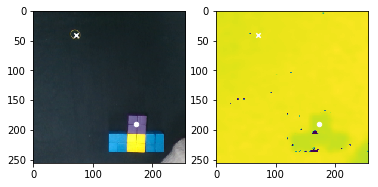

start pix : (173,190,678.0) -> goal pix : (71,41,712.6328125)
start pixel        goal pixek
x : 173.000000    x : 71.000000
y : 190.000000    y : 41.000000
z : 678.000000    z : 712.632813
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.847104    x : 0.587038
y : 0.094279    y : -0.090748
z : -0.202286    z : -0.195247
x : 0.018475    x : 0.008579
y : 0.981506    y : 0.989589
z : 0.029619    z : 0.008418
w : 0.188223    w : 0.143418


-----------data 94----------


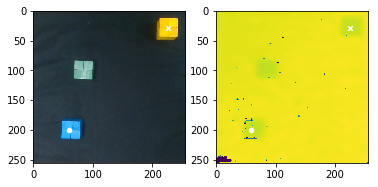

start pix : (59,201,678.0) -> goal pix : (226,29,676.0)
start pixel        goal pixek
x : 59.000000    x : 226.000000
y : 201.000000    y : 29.000000
z : 678.000000    z : 676.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.846616    x : 0.565634
y : -0.102071    y : 0.180046
z : -0.207671    z : -0.147202
x : -0.001222    x : 0.057583
y : 0.990526    y : 0.988326
z : -0.000627    z : 0.107478
w : 0.137317    w : 0.091344


-----------data 95----------


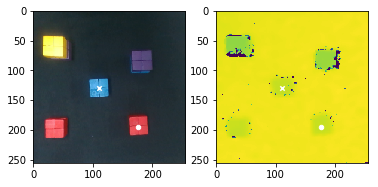

start pix : (176,195,678.0) -> goal pix : (111,130,676.0)
start pixel        goal pixek
x : 176.000000    x : 111.000000
y : 195.000000    y : 130.000000
z : 678.000000    z : 676.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.844483    x : 0.738576
y : 0.087583    y : -0.027614
z : -0.199600    z : -0.135768
x : -0.028298    x : -0.029484
y : 0.983896    y : 0.980959
z : 0.021845    z : 0.003175
w : 0.175129    w : 0.191935


-----------data 96----------


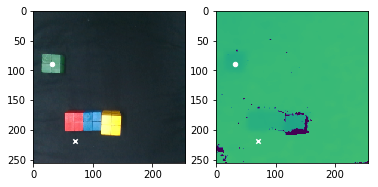

start pix : (31,90,663.0) -> goal pix : (70,218,730.0)
start pixel        goal pixek
x : 31.000000    x : 70.000000
y : 90.000000    y : 218.000000
z : 663.000000    z : 730.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.665629    x : 0.891859
y : -0.150451    y : -0.082472
z : -0.189219    z : -0.181719
x : -0.000218    x : -0.027308
y : 0.998624    y : 0.993931
z : -0.000866    z : 0.012672
w : 0.052433    w : 0.105810


-----------data 97----------


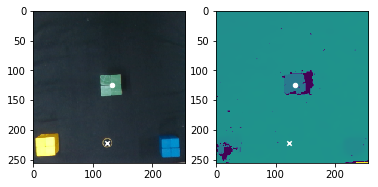

start pix : (132,124,577.0) -> goal pix : (123,223,733.484375)
start pixel        goal pixek
x : 132.000000    x : 123.000000
y : 124.000000    y : 223.000000
z : 577.000000    z : 733.484375
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.737321    x : 0.908789
y : 0.017391    y : 0.000249
z : -0.095310    z : -0.193392
x : -0.045856    x : -0.084588
y : 0.993559    y : 0.980840
z : -0.017646    z : -0.001807
w : 0.102109    w : 0.175483


-----------data 98----------


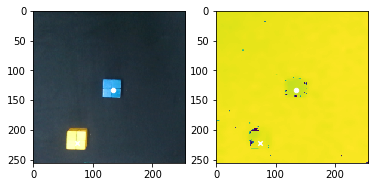

start pix : (134,133,678.0) -> goal pix : (74,222,720.0)
start pixel        goal pixek
x : 134.000000    x : 74.000000
y : 133.000000    y : 222.000000
z : 678.000000    z : 720.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.742372    x : 0.881241
y : 0.013726    y : -0.087527
z : -0.204324    z : -0.158055
x : -0.023459    x : -0.002132
y : 0.991101    y : 0.997101
z : -0.036998    z : -0.019007
w : 0.125696    w : 0.073651


-----------data 99----------


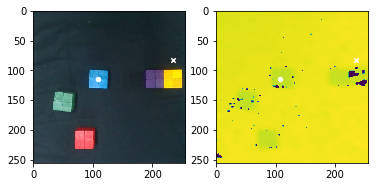

start pix : (108,115,672.0) -> goal pix : (235,82,731.002746582)
start pixel        goal pixek
x : 108.000000    x : 235.000000
y : 115.000000    y : 82.000000
z : 672.000000    z : 731.002747
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.705367    x : 0.653587
y : -0.019722    y : 0.190310
z : -0.202198    z : -0.184071
x : 0.020993    x : -0.052381
y : 0.998014    y : 0.995633
z : -0.002547    z : 0.015177
w : 0.059344    w : 0.075772


-----------data 100----------


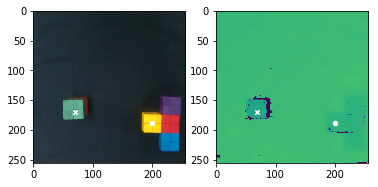

start pix : (200,189,682.0) -> goal pix : (69,170,628.0)
start pixel        goal pixek
x : 200.000000    x : 69.000000
y : 189.000000    y : 170.000000
z : 682.000000    z : 628.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.841219    x : 0.798758
y : 0.138969    y : -0.085460
z : -0.198091    z : -0.088250
x : -0.668675    x : 0.001163
y : 0.721172    y : 0.987497
z : 0.082246    z : -0.033863
w : 0.161307    w : 0.153952


-----------data 101----------


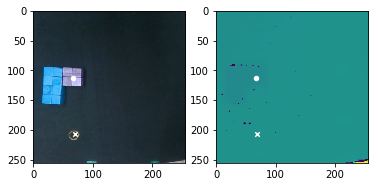

start pix : (67,113,676.0) -> goal pix : (69,207,721.0)
start pixel        goal pixek
x : 67.000000    x : 69.000000
y : 113.000000    y : 207.000000
z : 676.000000    z : 721.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.697394    x : 0.849204
y : -0.101582    y : -0.080814
z : -0.205307    z : -0.200544
x : -0.700634    x : -0.048672
y : 0.713298    y : 0.997404
z : -0.013826    z : -0.016639
w : 0.011300    w : 0.050390


-----------data 102----------


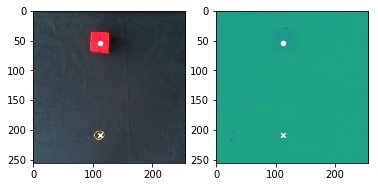

start pix : (112,54,671.3984375) -> goal pix : (112,208,720.9921875)
start pixel        goal pixek
x : 112.000000    x : 112.000000
y : 54.000000    y : 208.000000
z : 671.398437    z : 720.992188
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.598361    x : 0.875143
y : -0.010883    y : -0.020284
z : -0.208042    z : -0.219723
x : -0.012124    x : -0.081572
y : 0.997196    y : 0.987451
z : -0.011995    z : -0.006656
w : 0.072864    w : 0.135061


-----------data 103----------


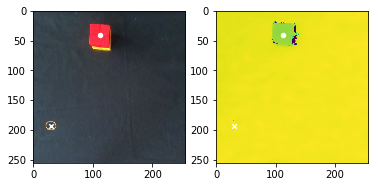

start pix : (112,40,617.0) -> goal pix : (30,193,725.0)
start pixel        goal pixek
x : 112.000000    x : 30.000000
y : 40.000000    y : 193.000000
z : 617.000000    z : 725.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.592184    x : 0.840600
y : -0.004967    y : -0.160665
z : -0.156106    z : -0.218978
x : 0.064753    x : -0.001647
y : 0.997638    y : 0.996042
z : 0.005868    z : 0.007353
w : 0.022165    w : 0.088564


-----------data 104----------


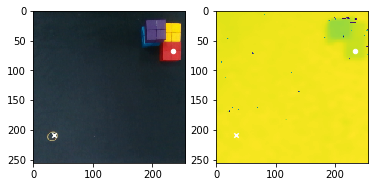

start pix : (234,68,679.660339355) -> goal pix : (34,209,730.2890625)
start pixel        goal pixek
x : 234.000000    x : 34.000000
y : 68.000000    y : 209.000000
z : 679.660339    z : 730.289062
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.639809    x : 0.875846
y : 0.173811    y : -0.182912
z : -0.207781    z : -0.206310
x : -0.020824    x : -0.036036
y : 0.998525    y : 0.997221
z : -0.033176    z : -0.022180
w : 0.037594    w : 0.061312


-----------data 105----------


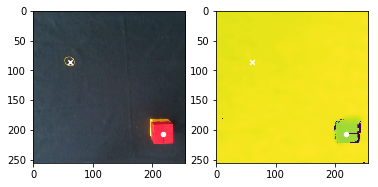

start pix : (218,207,630.0) -> goal pix : (61,86,710.81048584)
start pixel        goal pixek
x : 218.000000    x : 61.000000
y : 207.000000    y : 86.000000
z : 630.000000    z : 710.810486
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.870131    x : 0.655954
y : 0.161284    y : -0.110184
z : -0.153692    z : -0.213506
x : -0.045156    x : -0.062547
y : 0.973017    y : 0.992815
z : 0.070322    z : -0.042957
w : 0.215067    w : 0.092529


-----------data 106----------


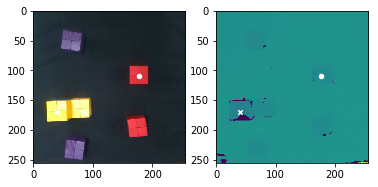

start pix : (177,110,679.0) -> goal pix : (40,170,620.6171875)
start pixel        goal pixek
x : 177.000000    x : 40.000000
y : 110.000000    y : 170.000000
z : 679.000000    z : 620.617188
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.714755    x : 0.806249
y : 0.085671    y : -0.134146
z : -0.212014    z : -0.106969
x : 0.007841    x : -0.015323
y : 0.993826    y : 0.992778
z : -0.008633    z : -0.018016
w : 0.110337    w : 0.117607


-----------data 107----------


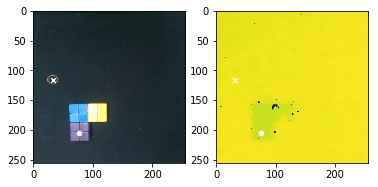

start pix : (76,205,678.0) -> goal pix : (32,116,723.859375)
start pixel        goal pixek
x : 76.000000    x : 32.000000
y : 205.000000    y : 116.000000
z : 678.000000    z : 723.859375
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.850810    x : 0.702915
y : -0.077996    y : -0.169002
z : -0.203077    z : -0.190731
x : -0.007544    x : -0.011317
y : 0.994128    y : 0.993629
z : -0.014250    z : 0.003369
w : 0.106999    w : 0.112079


-----------data 108----------


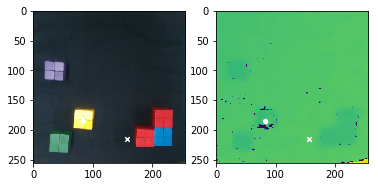

start pix : (83,185,690.8515625) -> goal pix : (157,215,730.0)
start pixel        goal pixek
x : 83.000000    x : 157.000000
y : 185.000000    y : 215.000000
z : 690.851562    z : 730.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.824519    x : 0.878387
y : -0.047336    y : 0.081893
z : -0.208017    z : -0.198089
x : 0.015503    x : -0.691498
y : 0.992543    y : 0.702278
z : -0.022402    z : 0.016747
w : 0.118807    w : 0.168393


-----------data 109----------


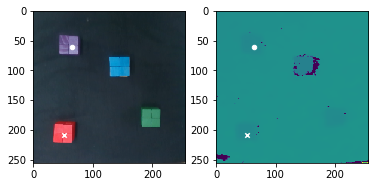

start pix : (64,61,670.7890625) -> goal pix : (52,208,683.0)
start pixel        goal pixek
x : 64.000000    x : 52.000000
y : 61.000000    y : 208.000000
z : 670.789062    z : 683.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.617784    x : 0.863259
y : -0.099432    y : -0.118000
z : -0.206812    z : -0.155553
x : 0.034784    x : 0.032294
y : 0.998777    y : 0.996354
z : -0.008378    z : -0.014452
w : 0.034123    w : 0.077630


-----------data 110----------


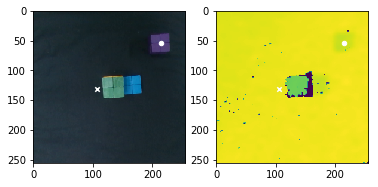

start pix : (215,54,685.0) -> goal pix : (106,131,719.0)
start pixel        goal pixek
x : 215.000000    x : 106.000000
y : 54.000000    y : 131.000000
z : 685.000000    z : 719.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.613919    x : 0.722218
y : 0.164150    y : -0.014985
z : -0.198441    z : -0.191825
x : -0.002492    x : -0.673692
y : 0.994041    y : 0.721782
z : 0.015064    z : 0.093048
w : 0.107934    w : 0.128501


-----------data 111----------


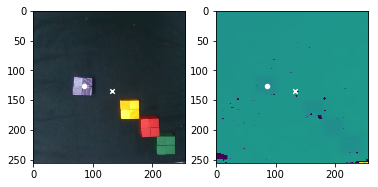

start pix : (85,127,672.858093262) -> goal pix : (132,134,726.1796875)
start pixel        goal pixek
x : 85.000000    x : 132.000000
y : 127.000000    y : 134.000000
z : 672.858093    z : 726.179688
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.734498    x : 0.754701
y : -0.054775    y : 0.020962
z : -0.197671    z : -0.197197
x : -0.050217    x : -0.074478
y : 0.994665    y : 0.990333
z : -0.011843    z : -0.007213
w : 0.089330    w : 0.116800


-----------data 112----------


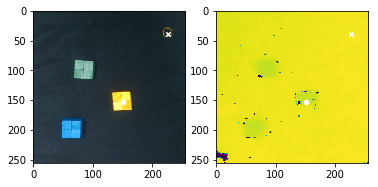

start pix : (151,154,695.242492676) -> goal pix : (227,38,727.579772949)
start pixel        goal pixek
x : 151.000000    x : 227.000000
y : 154.000000    y : 38.000000
z : 695.242493    z : 727.579773
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.772236    x : 0.574301
y : 0.046906    y : 0.185523
z : -0.203991    z : -0.191952
x : -0.018264    x : 0.013908
y : 0.991979    y : 0.994675
z : 0.009729    z : 0.032206
w : 0.124697    w : 0.096904


-----------data 113----------


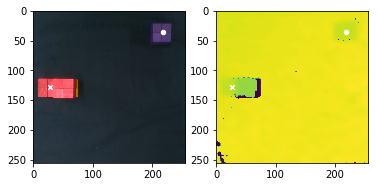

start pix : (218,36,680.1640625) -> goal pix : (27,128,671.952575684)
start pixel        goal pixek
x : 218.000000    x : 27.000000
y : 36.000000    y : 128.000000
z : 680.164062    z : 671.952576
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.591389    x : 0.732115
y : 0.163653    y : -0.141085
z : -0.195766    z : -0.141819
x : -0.013781    x : 0.707684
y : 0.991337    y : -0.694458
z : 0.012280    z : -0.059558
w : 0.130039    w : -0.115604


-----------data 114----------


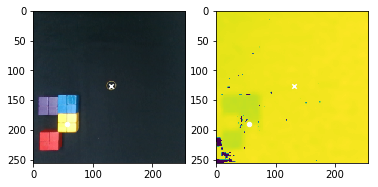

start pix : (56,190,708.09375) -> goal pix : (131,126,718.390625)
start pixel        goal pixek
x : 56.000000    x : 131.000000
y : 190.000000    y : 126.000000
z : 708.093750    z : 718.390625
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.821970    x : 0.715823
y : -0.106203    y : 0.019036
z : -0.201467    z : -0.196746
x : -0.009968    x : -0.079770
y : 0.996960    y : 0.995098
z : -0.022308    z : 0.012993
w : 0.073980    w : 0.056982


-----------data 115----------


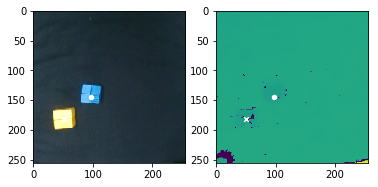

start pix : (97,144,677.0078125) -> goal pix : (51,182,666.369506836)
start pixel        goal pixek
x : 97.000000    x : 51.000000
y : 144.000000    y : 182.000000
z : 677.007812    z : 666.369507
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.764497    x : 0.833094
y : -0.045479    y : -0.121646
z : -0.197494    z : -0.145345
x : -0.018916    x : -0.064877
y : 0.996211    y : 0.993996
z : 0.023818    z : 0.028854
w : 0.081479    w : 0.083252


-----------data 116----------


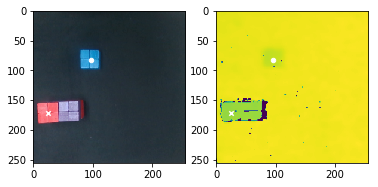

start pix : (96,83,676.0) -> goal pix : (25,172,628.0)
start pixel        goal pixek
x : 96.000000    x : 25.000000
y : 83.000000    y : 172.000000
z : 676.000000    z : 628.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.637763    x : 0.776214
y : -0.047790    y : -0.150111
z : -0.202727    z : -0.104105
x : 0.018042    x : -0.023485
y : 0.996721    y : 0.998106
z : -0.041521    z : -0.011767
w : 0.067069    w : 0.055622


-----------data 117----------


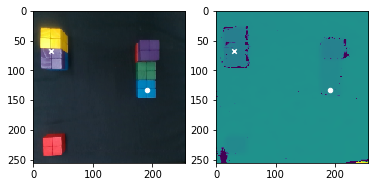

start pix : (191,133,684.0) -> goal pix : (30,67,617.0)
start pixel        goal pixek
x : 191.000000    x : 30.000000
y : 133.000000    y : 67.000000
z : 684.000000    z : 617.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.744691    x : 0.636339
y : 0.120105    y : -0.132479
z : -0.210604    z : -0.100515
x : -0.080323    x : -0.027033
y : 0.989745    y : 0.994307
z : -0.000932    z : -0.010817
w : 0.118116    w : 0.102495


-----------data 118----------


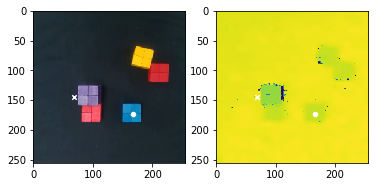

start pix : (167,174,676.0) -> goal pix : (68,144,720.0)
start pixel        goal pixek
x : 167.000000    x : 68.000000
y : 174.000000    y : 144.000000
z : 676.000000    z : 720.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.821324    x : 0.751731
y : 0.076273    y : -0.069301
z : -0.202951    z : -0.194926
x : -0.037850    x : 0.704499
y : 0.984355    y : -0.690126
z : -0.005481    z : -0.093702
w : 0.171997    w : -0.136482


-----------data 119----------


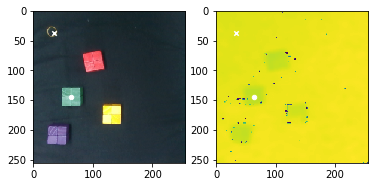

start pix : (63,145,673.0) -> goal pix : (34,37,709.0)
start pixel        goal pixek
x : 63.000000    x : 34.000000
y : 145.000000    y : 37.000000
z : 673.000000    z : 709.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.762535    x : 0.575178
y : -0.087674    y : -0.154835
z : -0.201498    z : -0.190609
x : -0.064190    x : -0.038272
y : 0.992200    y : 0.996928
z : 0.011090    z : -0.013165
w : 0.106100    w : 0.067056


-----------data 120----------


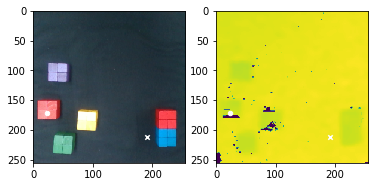

start pix : (23,171,685.3828125) -> goal pix : (191,212,726.9296875)
start pixel        goal pixek
x : 23.000000    x : 191.000000
y : 171.000000    y : 212.000000
z : 685.382812    z : 726.929688
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.798591    x : 0.882886
y : -0.155507    y : 0.133524
z : -0.195085    z : -0.178428
x : 0.000537    x : 0.719476
y : 0.990818    y : -0.659208
z : -0.026791    z : -0.003892
w : 0.132523    w : -0.218597


-----------data 121----------


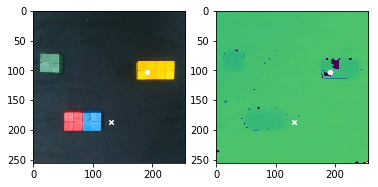

start pix : (191,102,682.7578125) -> goal pix : (131,187,721.8203125)
start pixel        goal pixek
x : 191.000000    x : 131.000000
y : 102.000000    y : 187.000000
z : 682.757812    z : 721.820312
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.685486    x : 0.834283
y : 0.125486    y : 0.019552
z : -0.191910    z : -0.190523
x : 0.705948    x : 0.713751
y : -0.704154    y : -0.693040
z : -0.014528    z : -0.005208
w : -0.074790    w : -0.101138


-----------data 122----------


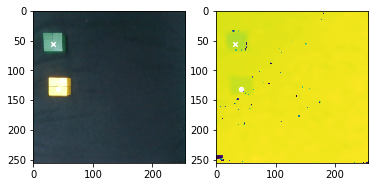

start pix : (42,132,684.284973145) -> goal pix : (32,55,661.8828125)
start pixel        goal pixek
x : 42.000000    x : 32.000000
y : 132.000000    y : 55.000000
z : 684.284973    z : 661.882812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.730778    x : 0.612291
y : -0.123630    y : -0.130822
z : -0.213286    z : -0.159808
x : 0.021638    x : 0.001960
y : 0.995595    y : 0.996753
z : 0.007340    z : 0.028937
w : 0.090935    w : 0.075116


-----------data 123----------


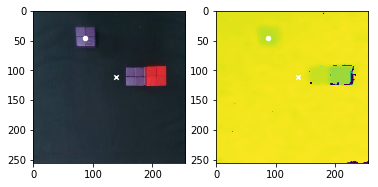

start pix : (87,45,668.0) -> goal pix : (138,111,725.0)
start pixel        goal pixek
x : 87.000000    x : 138.000000
y : 45.000000    y : 111.000000
z : 668.000000    z : 725.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.598693    x : 0.705164
y : -0.063502    y : 0.026915
z : -0.202109    z : -0.192632
x : 0.013701    x : -0.695125
y : 0.998180    y : 0.714539
z : -0.001700    z : 0.051298
w : 0.058704    w : 0.060036


-----------data 124----------


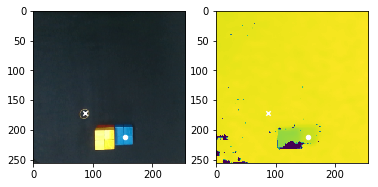

start pix : (154,212,679.1640625) -> goal pix : (87,172,726.5546875)
start pixel        goal pixek
x : 154.000000    x : 87.000000
y : 212.000000    y : 172.000000
z : 679.164062    z : 726.554688
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.864916    x : 0.795651
y : 0.065217    y : -0.051751
z : -0.200355    z : -0.193070
x : 0.714409    x : 0.735115
y : -0.685229    y : -0.668145
z : 0.118745    z : 0.071574
w : -0.077330    w : -0.089808


-----------data 125----------


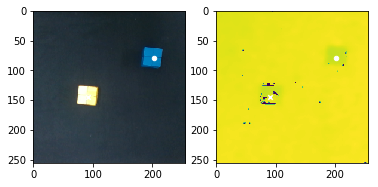

start pix : (202,80,681.0) -> goal pix : (91,144,702.96875)
start pixel        goal pixek
x : 202.000000    x : 91.000000
y : 80.000000    y : 144.000000
z : 681.000000    z : 702.968750
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.650568    x : 0.755979
y : 0.130139    y : -0.053326
z : -0.202021    z : -0.143760
x : 0.056016    x : 0.080358
y : 0.994533    y : 0.995164
z : -0.032484    z : -0.011814
w : 0.081926    w : 0.055243


-----------data 126----------


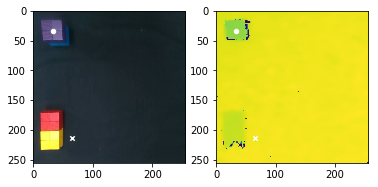

start pix : (33,33,620.0) -> goal pix : (65,213,728.5859375)
start pixel        goal pixek
x : 33.000000    x : 65.000000
y : 33.000000    y : 213.000000
z : 620.000000    z : 728.585938
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.580937    x : 0.874357
y : -0.137215    y : -0.105462
z : -0.157405    z : -0.192737
x : 0.015792    x : 0.716945
y : 0.998547    y : -0.692031
z : -0.010052    z : 0.035515
w : 0.050527    w : -0.076293


-----------data 127----------


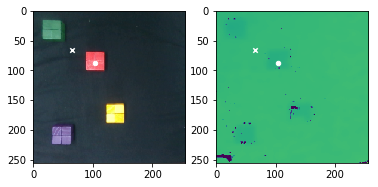

start pix : (104,87,673.3828125) -> goal pix : (65,65,711.801330566)
start pixel        goal pixek
x : 104.000000    x : 65.000000
y : 87.000000    y : 65.000000
z : 673.382812    z : 711.801331
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.662004    x : 0.625280
y : -0.036447    y : -0.096995
z : -0.197628    z : -0.192043
x : 0.027283    x : -0.004704
y : 0.996930    y : 0.996884
z : -0.017461    z : -0.022933
w : 0.071280    w : 0.075329


-----------data 128----------


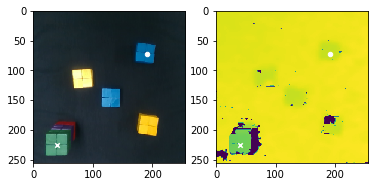

start pix : (191,73,680.0) -> goal pix : (40,226,579.0)
start pixel        goal pixek
x : 191.000000    x : 40.000000
y : 73.000000    y : 226.000000
z : 680.000000    z : 579.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.641537    x : 0.876432
y : 0.110921    y : -0.112533
z : -0.209018    z : -0.047510
x : -0.111456    x : -0.031618
y : 0.984867    y : 0.976357
z : -0.021279    z : -0.026766
w : 0.131004    w : 0.212158


-----------data 129----------


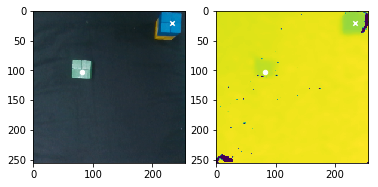

start pix : (82,103,676.9609375) -> goal pix : (233,21,630.0)
start pixel        goal pixek
x : 82.000000    x : 233.000000
y : 103.000000    y : 21.000000
z : 676.960938    z : 630.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.675462    x : 0.567710
y : -0.067687    y : 0.177241
z : -0.198921    z : -0.092851
x : 0.024168    x : 0.052988
y : 0.998325    y : 0.996467
z : -0.012945    z : 0.002777
w : 0.050942    w : 0.065107


-----------data 130----------


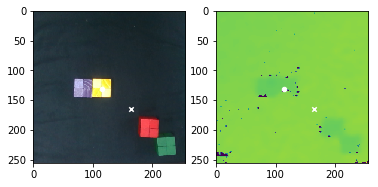

start pix : (115,131,685.890625) -> goal pix : (164,165,729.8359375)
start pixel        goal pixek
x : 115.000000    x : 164.000000
y : 131.000000    y : 165.000000
z : 685.890625    z : 729.835938
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.731292    x : 0.800555
y : -0.009332    y : 0.073916
z : -0.196683    z : -0.192492
x : -0.699782    x : -0.038528
y : 0.713562    y : 0.995841
z : 0.004968    z : 0.015681
w : 0.033317    w : 0.081055


-----------data 131----------


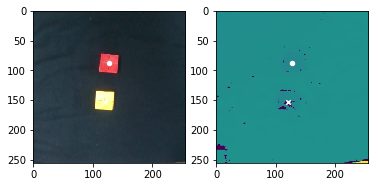

start pix : (127,88,673.0) -> goal pix : (121,154,617.740112305)
start pixel        goal pixek
x : 127.000000    x : 121.000000
y : 88.000000    y : 154.000000
z : 673.000000    z : 617.740112
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.669597    x : 0.775977
y : 0.009227    y : -0.008881
z : -0.207788    z : -0.152363
x : -0.039553    x : 0.001157
y : 0.997008    y : 0.997269
z : 0.025357    z : 0.019377
w : 0.061381    w : 0.071255


-----------data 132----------


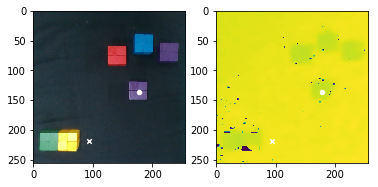

start pix : (178,136,679.0) -> goal pix : (94,218,729.64654541)
start pixel        goal pixek
x : 178.000000    x : 94.000000
y : 136.000000    y : 218.000000
z : 679.000000    z : 729.646545
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.743209    x : 0.880500
y : 0.103332    y : -0.034562
z : -0.193641    z : -0.188766
x : -0.020832    x : 0.716050
y : 0.993771    y : -0.682375
z : 0.039489    z : -0.021175
w : 0.102103    w : -0.145562


-----------data 133----------


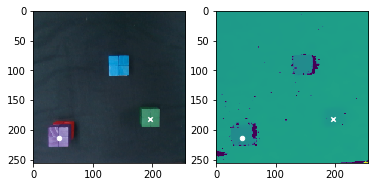

start pix : (43,214,628.0) -> goal pix : (196,181,677.929504395)
start pixel        goal pixek
x : 43.000000    x : 196.000000
y : 214.000000    y : 181.000000
z : 628.000000    z : 677.929504
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.872431    x : 0.837973
y : -0.117909    y : 0.132982
z : -0.153085    z : -0.142972
x : -0.001835    x : 0.014129
y : 0.987232    y : 0.987209
z : -0.013545    z : -0.005614
w : 0.158704    w : 0.158706


-----------data 134----------


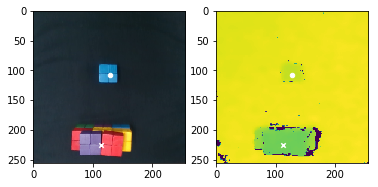

start pix : (128,107,676.0) -> goal pix : (113,225,582.0)
start pixel        goal pixek
x : 128.000000    x : 113.000000
y : 107.000000    y : 225.000000
z : 676.000000    z : 582.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.703487    x : 0.883031
y : 0.001301    y : -0.003931
z : -0.209531    z : -0.054694
x : 0.003782    x : -0.023406
y : 0.996779    y : 0.994719
z : -0.021242    z : 0.009516
w : 0.077242    w : 0.099475


-----------data 135----------


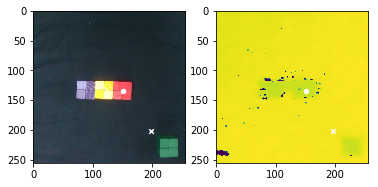

start pix : (151,134,676.0) -> goal pix : (197,202,724.0)
start pixel        goal pixek
x : 151.000000    x : 197.000000
y : 134.000000    y : 202.000000
z : 676.000000    z : 724.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.734018    x : 0.853816
y : 0.046335    y : 0.120815
z : -0.191677    z : -0.186401
x : -0.657599    x : -0.022168
y : 0.751055    y : 0.987562
z : 0.049411    z : 0.027044
w : 0.032239    w : 0.153293


-----------data 136----------


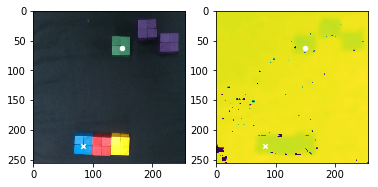

start pix : (149,63,676.727844238) -> goal pix : (83,227,680.1953125)
start pixel        goal pixek
x : 149.000000    x : 83.000000
y : 63.000000    y : 227.000000
z : 676.727844    z : 680.195312
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.614919    x : 0.894191
y : 0.044102    y : -0.053348
z : -0.191376    z : -0.131800
x : 0.008930    x : 0.075842
y : 0.998932    y : 0.991206
z : 0.023096    z : 0.046362
w : 0.039016    w : 0.098031


-----------data 137----------


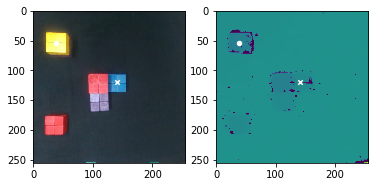

start pix : (38,54,619.719848633) -> goal pix : (141,120,675.5390625)
start pixel        goal pixek
x : 38.000000    x : 141.000000
y : 54.000000    y : 120.000000
z : 619.719849    z : 675.539063
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.626248    x : 0.717038
y : -0.127321    y : 0.039322
z : -0.153293    z : -0.145686
x : 0.018193    x : 0.712673
y : 0.995977    y : -0.699641
z : -0.035781    z : -0.012066
w : 0.080114    w : -0.049542


-----------data 138----------


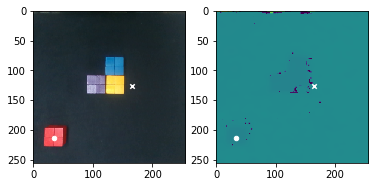

start pix : (34,213,678.2890625) -> goal pix : (165,127,725.1640625)
start pixel        goal pixek
x : 34.000000    x : 165.000000
y : 213.000000    y : 127.000000
z : 678.289062    z : 725.164063
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.858680    x : 0.700920
y : -0.143906    y : 0.097590
z : -0.210443    z : -0.201623
x : 0.001293    x : -0.680745
y : 0.984561    y : 0.714391
z : -0.012703    z : 0.144015
w : 0.174573    w : 0.074101


-----------data 139----------


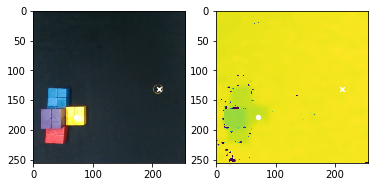

start pix : (71,178,676.0) -> goal pix : (211,131,728.6953125)
start pixel        goal pixek
x : 71.000000    x : 211.000000
y : 178.000000    y : 131.000000
z : 676.000000    z : 728.695312
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.796795    x : 0.721449
y : -0.080640    y : 0.154136
z : -0.205382    z : -0.202106
x : 0.706776    x : -0.688356
y : -0.706697    y : 0.722047
z : -0.003716    z : 0.051539
w : -0.032134    w : 0.046457


-----------data 140----------


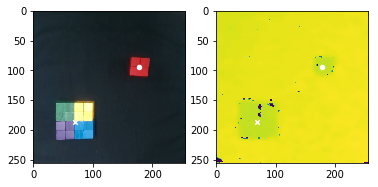

start pix : (178,95,680.0) -> goal pix : (69,187,677.8203125)
start pixel        goal pixek
x : 178.000000    x : 69.000000
y : 95.000000    y : 187.000000
z : 680.000000    z : 677.820312
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.685568    x : 0.834113
y : 0.101603    y : -0.081247
z : -0.206807    z : -0.149573
x : -0.003426    x : -0.036215
y : 0.990050    y : 0.988673
z : -0.018686    z : -0.003398
w : 0.139425    w : 0.145611


-----------data 141----------


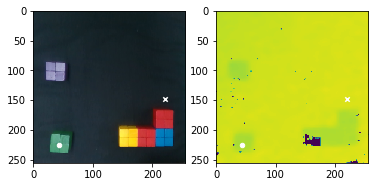

start pix : (43,226,676.0) -> goal pix : (221,149,730.5859375)
start pixel        goal pixek
x : 43.000000    x : 221.000000
y : 226.000000    y : 149.000000
z : 676.000000    z : 730.585938
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.893783    x : 0.785804
y : -0.113053    y : 0.175082
z : -0.203979    z : -0.192534
x : 0.027534    x : -0.021812
y : 0.983527    y : 0.977552
z : -0.011115    z : -0.004012
w : 0.178307    w : 0.209525


-----------data 142----------


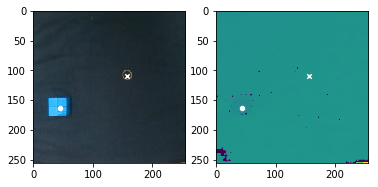

start pix : (44,163,673.4453125) -> goal pix : (157,109,725.0)
start pixel        goal pixek
x : 44.000000    x : 157.000000
y : 163.000000    y : 109.000000
z : 673.445312    z : 725.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.793859    x : 0.707446
y : -0.141139    y : 0.058563
z : -0.202722    z : -0.198671
x : -0.013993    x : -0.019951
y : 0.993464    y : 0.993073
z : 0.006948    z : 0.023515
w : 0.113075    w : 0.113377


-----------data 143----------


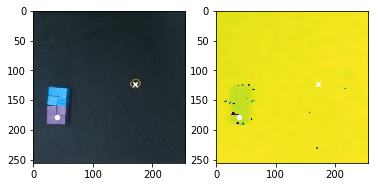

start pix : (39,178,678.0) -> goal pix : (171,123,728.140625)
start pixel        goal pixek
x : 39.000000    x : 171.000000
y : 178.000000    y : 123.000000
z : 678.000000    z : 728.140625
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.796422    x : 0.711961
y : -0.150313    y : 0.082735
z : -0.201589    z : -0.192162
x : 0.030205    x : -0.083664
y : 0.998116    y : 0.993952
z : -0.035738    z : -0.027883
w : 0.039681    w : 0.065435


-----------data 144----------


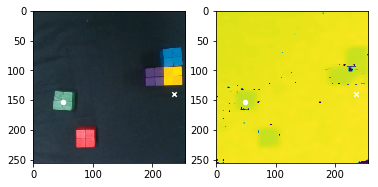

start pix : (49,153,671.0) -> goal pix : (236,140,726.5546875)
start pixel        goal pixek
x : 49.000000    x : 236.000000
y : 153.000000    y : 140.000000
z : 671.000000    z : 726.554688
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.767249    x : 0.755721
y : -0.117574    y : 0.192348
z : -0.201861    z : -0.191422
x : 0.036263    x : 0.010296
y : 0.994901    y : 0.996463
z : -0.003497    z : 0.032648
w : 0.094042    w : 0.076748


-----------data 145----------


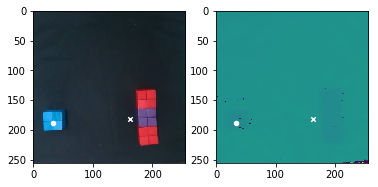

start pix : (33,188,676.0) -> goal pix : (163,182,722.3984375)
start pixel        goal pixek
x : 33.000000    x : 163.000000
y : 188.000000    y : 182.000000
z : 676.000000    z : 722.398438
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.834568    x : 0.818907
y : -0.152462    y : 0.076002
z : -0.203883    z : -0.203021
x : -0.059489    x : 0.711138
y : 0.981721    y : -0.672993
z : -0.024229    z : -0.114844
w : 0.179160    w : -0.167851


-----------data 146----------


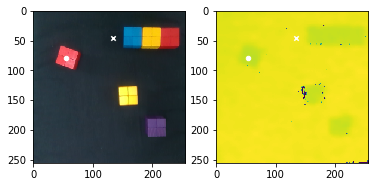

start pix : (54,79,671.0) -> goal pix : (134,45,726.0)
start pixel        goal pixek
x : 54.000000    x : 134.000000
y : 79.000000    y : 45.000000
z : 671.000000    z : 726.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.647660    x : 0.594618
y : -0.108260    y : 0.017522
z : -0.201874    z : -0.190058
x : 0.064614    x : -0.686522
y : 0.992892    y : 0.716736
z : 0.020780    z : -0.042572
w : 0.097771    w : 0.114742


-----------data 147----------


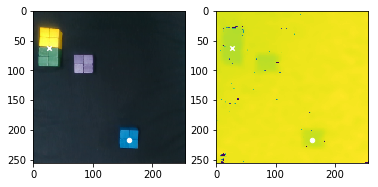

start pix : (161,217,679.0) -> goal pix : (26,62,658.0)
start pixel        goal pixek
x : 161.000000    x : 26.000000
y : 217.000000    y : 62.000000
z : 679.000000    z : 658.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.898522    x : 0.634607
y : 0.076777    y : -0.139572
z : -0.201386    z : -0.146693
x : 0.010647    x : 0.032313
y : 0.970425    y : 0.970918
z : 0.013525    z : 0.031522
w : 0.240789    w : 0.235117


-----------data 148----------


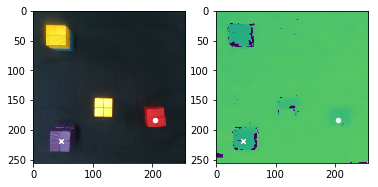

start pix : (205,183,686.8828125) -> goal pix : (46,219,628.3203125)
start pixel        goal pixek
x : 205.000000    x : 46.000000
y : 183.000000    y : 219.000000
z : 686.882812    z : 628.320312
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.833803    x : 0.883211
y : 0.141135    y : -0.115157
z : -0.209615    z : -0.097118
x : -0.050524    x : 0.035132
y : 0.981918    y : 0.983324
z : 0.034258    z : 0.001607
w : 0.179196    w : 0.178427


-----------data 149----------


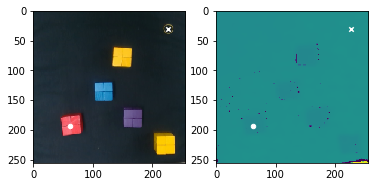

start pix : (62,194,678.0) -> goal pix : (227,30,736.0)
start pixel        goal pixek
x : 62.000000    x : 227.000000
y : 194.000000    y : 30.000000
z : 678.000000    z : 736.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.851530    x : 0.577409
y : -0.088824    y : 0.198097
z : -0.204133    z : -0.189909
x : -0.053280    x : -0.049927
y : 0.979995    y : 0.986414
z : -0.024261    z : -0.008082
w : 0.190217    w : 0.156299


-----------data 150----------


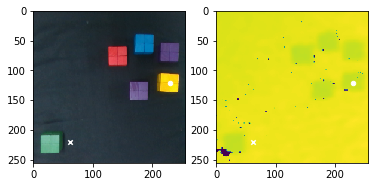

start pix : (230,122,684.984375) -> goal pix : (62,220,725.7265625)
start pixel        goal pixek
x : 230.000000    x : 62.000000
y : 122.000000    y : 220.000000
z : 684.984375    z : 725.726562
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.730244    x : 0.872481
y : 0.183377    y : -0.085024
z : -0.194970    z : -0.190186
x : 0.016717    x : 0.733792
y : 0.990823    y : -0.674996
z : 0.040202    z : -0.004748
w : 0.127964    w : -0.076857


-----------data 151----------


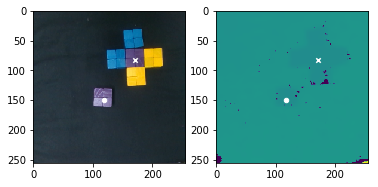

start pix : (118,150,681.0) -> goal pix : (171,82,677.0390625)
start pixel        goal pixek
x : 118.000000    x : 171.000000
y : 150.000000    y : 82.000000
z : 681.000000    z : 677.039062
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.766179    x : 0.658750
y : -0.010521    y : 0.080349
z : -0.193883    z : -0.141782
x : -0.009283    x : -0.031349
y : 0.996351    y : 0.996411
z : -0.028780    z : -0.001540
w : 0.079818    w : 0.078618


-----------data 152----------


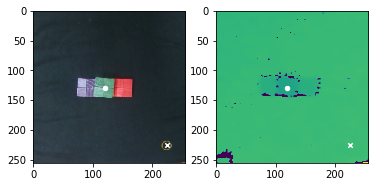

start pix : (120,130,628.0) -> goal pix : (225,226,732.387634277)
start pixel        goal pixek
x : 120.000000    x : 225.000000
y : 130.000000    y : 226.000000
z : 628.000000    z : 732.387634
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.743374    x : 0.913930
y : -0.000703    y : 0.172680
z : -0.148863    z : -0.188139
x : 0.051988    x : -0.089496
y : 0.993935    y : 0.963667
z : 0.012995    z : 0.057247
w : 0.096028    w : 0.245070


-----------data 153----------


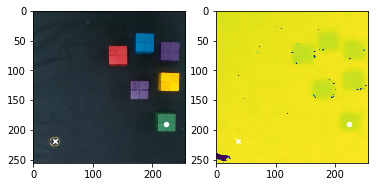

start pix : (223,190,684.070495605) -> goal pix : (37,219,725.1640625)
start pixel        goal pixek
x : 223.000000    x : 37.000000
y : 190.000000    y : 219.000000
z : 684.070496    z : 725.164063
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.852632    x : 0.904844
y : 0.177862    y : -0.146732
z : -0.187412    z : -0.180267
x : -0.042572    x : -0.063775
y : 0.977286    y : 0.978318
z : 0.039524    z : 0.009325
w : 0.203810    w : 0.196824


-----------data 154----------


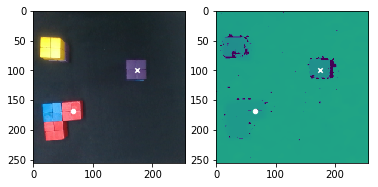

start pix : (66,169,675.2109375) -> goal pix : (174,100,626.3203125)
start pixel        goal pixek
x : 66.000000    x : 174.000000
y : 169.000000    y : 100.000000
z : 675.210938    z : 626.320313
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.780862    x : 0.679974
y : -0.093643    y : 0.083646
z : -0.206378    z : -0.097198
x : 0.701278    x : -0.031300
y : 0.710398    y : 0.998686
z : 0.029808    z : -0.034268
w : 0.051527    w : -0.021732


-----------data 155----------


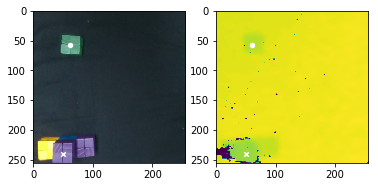

start pix : (61,58,663.0) -> goal pix : (50,240,630.0)
start pixel        goal pixek
x : 61.000000    x : 50.000000
y : 58.000000    y : 240.000000
z : 663.000000    z : 630.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.619808    x : 0.911184
y : -0.093488    y : -0.104727
z : -0.185202    z : -0.076595
x : 0.006924    x : -0.022683
y : 0.998617    y : 0.992504
z : 0.048085    z : 0.029384
w : 0.020092    w : 0.116436


-----------data 156----------


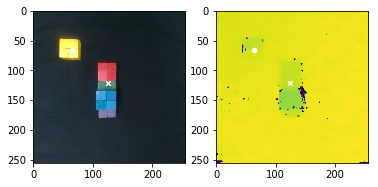

start pix : (64,66,687.6328125) -> goal pix : (125,121,677.0)
start pixel        goal pixek
x : 64.000000    x : 125.000000
y : 66.000000    y : 121.000000
z : 687.632812    z : 677.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.628595    x : 0.722613
y : -0.093987    y : 0.008838
z : -0.205838    z : -0.151686
x : 0.054840    x : 0.009534
y : 0.996222    y : 0.995212
z : -0.007761    z : 0.048042
w : 0.066886    w : 0.084588


-----------data 157----------


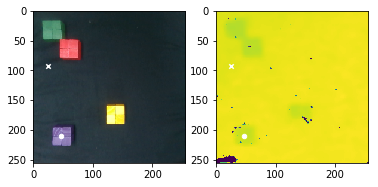

start pix : (47,210,680.0) -> goal pix : (25,93,709.0)
start pixel        goal pixek
x : 47.000000    x : 25.000000
y : 210.000000    y : 93.000000
z : 680.000000    z : 709.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.868707    x : 0.674050
y : -0.130641    y : -0.151467
z : -0.199040    z : -0.187199
x : -0.018162    x : 0.008758
y : 0.986779    y : 0.993485
z : -0.002941    z : 0.013090
w : 0.161027    w : 0.112873


-----------data 158----------


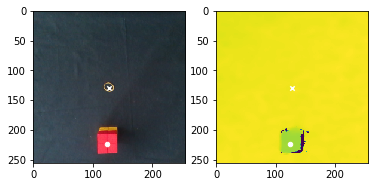

start pix : (124,224,635.0) -> goal pix : (127,130,722.7265625)
start pixel        goal pixek
x : 124.000000    x : 127.000000
y : 224.000000    y : 130.000000
z : 635.000000    z : 722.726562
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.879774    x : 0.727630
y : 0.004070    y : 0.009926
z : -0.155700    z : -0.219237
x : -0.032458    x : -0.025514
y : 0.987463    y : 0.999327
z : -0.004996    z : -0.015252
w : 0.154399    w : 0.021475


-----------data 159----------


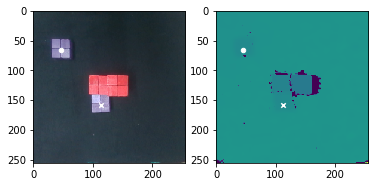

start pix : (46,65,674.4765625) -> goal pix : (113,158,679.7734375)
start pixel        goal pixek
x : 46.000000    x : 113.000000
y : 65.000000    y : 158.000000
z : 674.476562    z : 679.773437
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.625363    x : 0.778221
y : -0.134774    y : -0.029873
z : -0.194768    z : -0.142325
x : 0.004965    x : -0.025435
y : 0.995411    y : 0.998321
z : -0.032300    z : -0.042831
w : 0.089936    w : 0.029571


-----------data 160----------


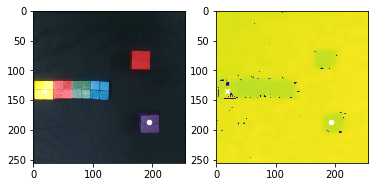

start pix : (194,187,684.0) -> goal pix : (18,135,684.0)
start pixel        goal pixek
x : 194.000000    x : 18.000000
y : 187.000000    y : 135.000000
z : 684.000000    z : 684.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.844948    x : 0.746117
y : 0.134363    y : -0.164484
z : -0.199761    z : -0.142781
x : -0.051352    x : -0.007856
y : 0.979374    y : 0.984841
z : 0.017845    z : -0.012874
w : 0.194607    w : 0.172804


-----------data 161----------


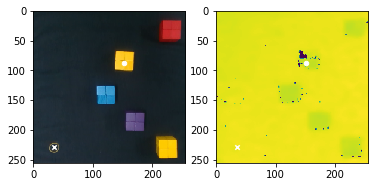

start pix : (152,87,681.050842285) -> goal pix : (35,229,727.0625)
start pixel        goal pixek
x : 152.000000    x : 35.000000
y : 87.000000    y : 229.000000
z : 681.050842    z : 727.062500
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.662508    x : 0.917961
y : 0.055183    y : -0.160173
z : -0.205485    z : -0.192505
x : 0.005509    x : -0.024669
y : 0.992538    y : 0.986226
z : 0.012389    z : -0.025403
w : 0.121180    w : 0.161567


-----------data 162----------


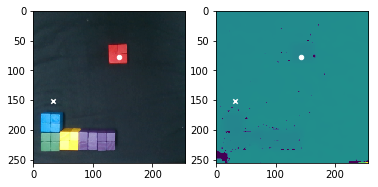

start pix : (143,77,672.5078125) -> goal pix : (32,152,714.1328125)
start pixel        goal pixek
x : 143.000000    x : 32.000000
y : 77.000000    y : 152.000000
z : 672.507812    z : 714.132812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.640205    x : 0.779045
y : 0.039166    y : -0.151740
z : -0.195452    z : -0.187204
x : -0.035502    x : 0.010283
y : 0.997762    y : 0.995340
z : 0.024801    z : 0.004515
w : 0.050948    w : 0.095773


-----------data 163----------


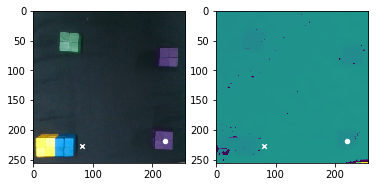

start pix : (221,218,686.0) -> goal pix : (81,227,725.1953125)
start pixel        goal pixek
x : 221.000000    x : 81.000000
y : 218.000000    y : 227.000000
z : 686.000000    z : 725.195312
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.912107    x : 0.900289
y : 0.166026    y : -0.033926
z : -0.187441    z : -0.182192
x : -0.009613    x : 0.728457
y : 0.957382    y : -0.634453
z : 0.022079    z : -0.090827
w : 0.287819    w : -0.242012


-----------data 164----------


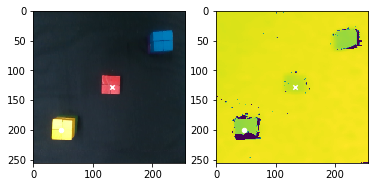

start pix : (47,201,630.0) -> goal pix : (132,128,675.0)
start pixel        goal pixek
x : 47.000000    x : 132.000000
y : 201.000000    y : 128.000000
z : 630.000000    z : 675.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.846554    x : 0.735858
y : -0.104094    y : 0.024849
z : -0.144830    z : -0.137471
x : 0.009920    x : 0.023852
y : 0.985201    y : 0.982540
z : -0.023200    z : -0.015041
w : 0.169538    w : 0.183902


-----------data 165----------


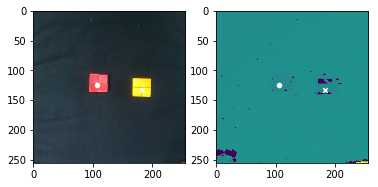

start pix : (106,124,676.0) -> goal pix : (183,133,680.0)
start pixel        goal pixek
x : 106.000000    x : 183.000000
y : 124.000000    y : 133.000000
z : 676.000000    z : 680.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.723179    x : 0.739495
y : -0.025408    y : 0.099741
z : -0.210594    z : -0.156886
x : 0.004152    x : 0.030162
y : 0.997053    y : 0.995652
z : 0.030100    z : 0.025149
w : 0.070436    w : 0.084464


-----------data 166----------


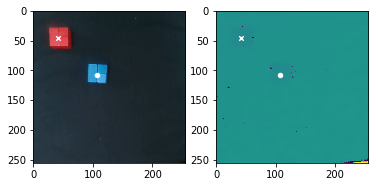

start pix : (107,107,676.004943848) -> goal pix : (42,46,666.0)
start pixel        goal pixek
x : 107.000000    x : 42.000000
y : 107.000000    y : 46.000000
z : 676.004944    z : 666.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.696056    x : 0.599652
y : -0.032746    y : -0.131454
z : -0.208431    z : -0.147884
x : 0.005997    x : -0.041954
y : 0.993267    y : 0.990023
z : -0.050024    z : -0.042514
w : 0.104314    w : 0.127619


-----------data 167----------


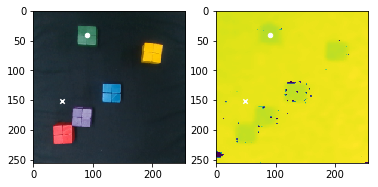

start pix : (90,41,670.0) -> goal pix : (48,151,721.696228027)
start pixel        goal pixek
x : 90.000000    x : 48.000000
y : 41.000000    y : 151.000000
z : 670.000000    z : 721.696228
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.595731    x : 0.773797
y : -0.048491    y : -0.125663
z : -0.195659    z : -0.188079
x : -0.002301    x : -0.039629
y : 0.994096    y : 0.987508
z : -0.005623    z : -0.000764
w : 0.108332    w : 0.152499


-----------data 168----------


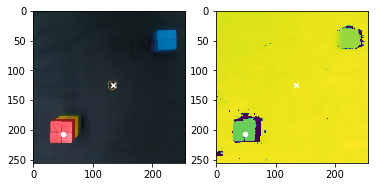

start pix : (49,207,578.0) -> goal pix : (134,125,722.1484375)
start pixel        goal pixek
x : 49.000000    x : 134.000000
y : 207.000000    y : 125.000000
z : 578.000000    z : 722.148438
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.845237    x : 0.737854
y : -0.098545    y : 0.015443
z : -0.096483    z : -0.179658
x : -0.001748    x : -0.041260
y : 0.984570    y : 0.991604
z : -0.020217    z : 0.016460
w : 0.173813    w : 0.121441


-----------data 169----------


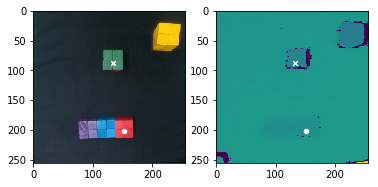

start pix : (152,202,681.1328125) -> goal pix : (133,87,625.3359375)
start pixel        goal pixek
x : 152.000000    x : 133.000000
y : 202.000000    y : 87.000000
z : 681.132812    z : 625.335938
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.863589    x : 0.667652
y : 0.048685    y : 0.012083
z : -0.199494    z : -0.089874
x : 0.717629    x : 0.019214
y : -0.686649    y : 0.991784
z : 0.037138    z : -0.059260
w : -0.110192    w : 0.111727


-----------data 170----------


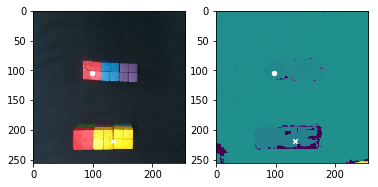

start pix : (98,104,672.0) -> goal pix : (133,219,633.0)
start pixel        goal pixek
x : 98.000000    x : 133.000000
y : 104.000000    y : 219.000000
z : 672.000000    z : 633.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.692184    x : 0.882377
y : -0.034386    y : 0.021019
z : -0.199246    z : -0.092005
x : -0.680558    x : 0.017782
y : 0.719408    y : 0.989149
z : 0.109124    z : -0.010188
w : 0.085937    w : 0.145482


-----------data 171----------


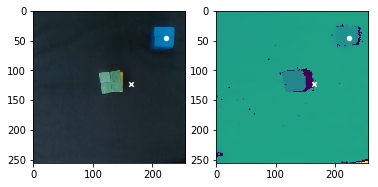

start pix : (223,46,631.0) -> goal pix : (164,123,725.0)
start pixel        goal pixek
x : 223.000000    x : 164.000000
y : 46.000000    y : 123.000000
z : 631.000000    z : 725.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.609000    x : 0.729854
y : 0.159913    y : 0.080530
z : -0.156211    z : -0.183483
x : 0.031282    x : 0.721345
y : 0.996200    y : 0.687770
z : 0.037584    z : 0.005822
w : 0.072070    w : 0.081240


-----------data 172----------


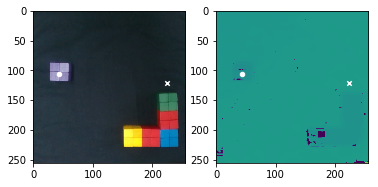

start pix : (43,106,673.0) -> goal pix : (224,121,729.2578125)
start pixel        goal pixek
x : 43.000000    x : 224.000000
y : 106.000000    y : 121.000000
z : 673.000000    z : 729.257812
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.686346    x : 0.733684
y : -0.121651    y : 0.176759
z : -0.204912    z : -0.201539
x : 0.019554    x : -0.008021
y : 0.996497    y : 0.991152
z : -0.020631    z : 0.000618
w : 0.078644    w : 0.132491


-----------data 173----------


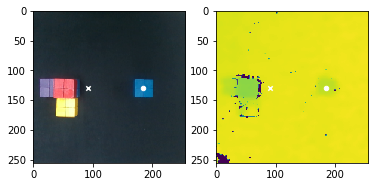

start pix : (185,130,678.0) -> goal pix : (91,130,722.3203125)
start pixel        goal pixek
x : 185.000000    x : 91.000000
y : 130.000000    y : 130.000000
z : 678.000000    z : 722.320312
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.729793    x : 0.718626
y : 0.120694    y : -0.036009
z : -0.204334    z : -0.181660
x : -0.004238    x : 0.715078
y : 0.992858    y : -0.689720
z : -0.002570    z : -0.088120
w : 0.119196    w : -0.072010


-----------data 174----------


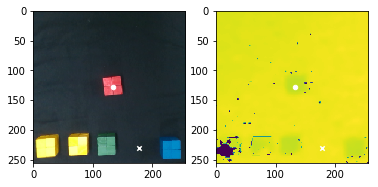

start pix : (133,128,676.0) -> goal pix : (178,230,728.0)
start pixel        goal pixek
x : 133.000000    x : 178.000000
y : 128.000000    y : 230.000000
z : 676.000000    z : 728.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.731958    x : 0.902187
y : 0.025931    y : 0.103583
z : -0.193602    z : -0.188163
x : -0.054301    x : -0.013507
y : 0.994240    y : 0.984279
z : 0.022123    z : 0.048261
w : 0.089712    w : 0.169362


-----------data 175----------


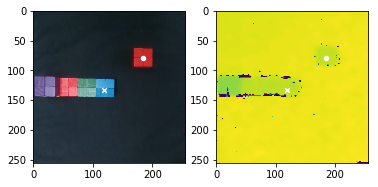

start pix : (185,80,578.145629883) -> goal pix : (119,133,673.6640625)
start pixel        goal pixek
x : 185.000000    x : 119.000000
y : 80.000000    y : 133.000000
z : 578.145630    z : 673.664062
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.667418    x : 0.751611
y : 0.105486    y : -0.003065
z : -0.196232    z : -0.139696
x : -0.011167    x : 0.001206
y : 0.993305    y : 0.995439
z : 0.024238    z : -0.014582
w : 0.112399    w : 0.094271


-----------data 176----------


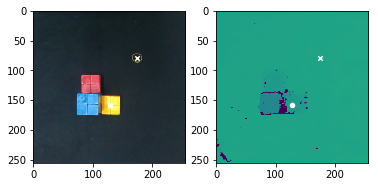

start pix : (128,159,684.0) -> goal pix : (174,79,730.0)
start pixel        goal pixek
x : 128.000000    x : 174.000000
y : 159.000000    y : 79.000000
z : 684.000000    z : 730.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.777084    x : 0.644521
y : -0.002790    y : 0.090073
z : -0.195823    z : -0.190355
x : 0.730311    x : 0.996539
y : -0.651581    y : 0.067728
z : 0.202941    z : 0.048129
w : 0.030037    w : 0.002636


-----------data 177----------


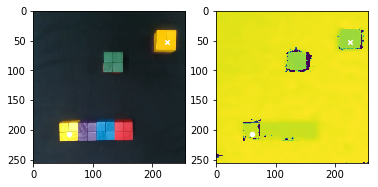

start pix : (60,207,681.154724121) -> goal pix : (225,52,632.0)
start pixel        goal pixek
x : 60.000000    x : 225.000000
y : 207.000000    y : 52.000000
z : 681.154724    z : 632.000000
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.860954    x : 0.613543
y : -0.104726    y : 0.164980
z : -0.207245    z : -0.093508
x : 0.686913    x : 0.032275
y : 0.721099    y : 0.990831
z : 0.024127    z : 0.083276
w : 0.087097    w : 0.101374


-----------data 178----------


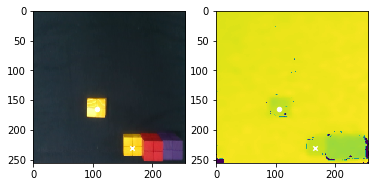

start pix : (106,165,680.1640625) -> goal pix : (166,231,684.0)
start pixel        goal pixek
x : 106.000000    x : 166.000000
y : 165.000000    y : 231.000000
z : 680.164062    z : 684.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.796517    x : 0.896881
y : -0.027188    y : 0.082341
z : -0.191278    z : -0.128452
x : -0.053403    x : 0.731358
y : 0.986282    y : -0.662117
z : -0.021485    z : -0.009893
w : 0.154706    w : -0.163156


-----------data 179----------


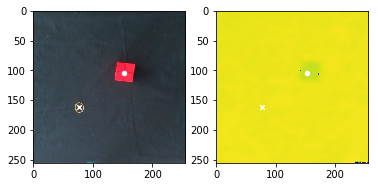

start pix : (153,105,680.6484375) -> goal pix : (77,162,725.2890625)
start pixel        goal pixek
x : 153.000000    x : 77.000000
y : 105.000000    y : 162.000000
z : 680.648437    z : 725.289062
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.687772    x : 0.830425
y : 0.044953    y : -0.079795
z : -0.206434    z : -0.214795
x : -0.078579    x : -0.152367
y : 0.993477    y : 0.984445
z : 0.013617    z : 0.008588
w : 0.081506    w : 0.087055


-----------data 180----------


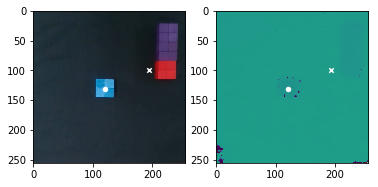

start pix : (121,132,676.0) -> goal pix : (194,100,723.0)
start pixel        goal pixek
x : 121.000000    x : 194.000000
y : 132.000000    y : 100.000000
z : 676.000000    z : 723.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.751150    x : 0.687751
y : -0.017017    y : 0.122170
z : -0.205768    z : -0.192150
x : -0.019681    x : -0.693997
y : 0.987320    y : 0.707227
z : -0.035481    z : 0.063886
w : 0.153469    w : 0.118814


-----------data 181----------


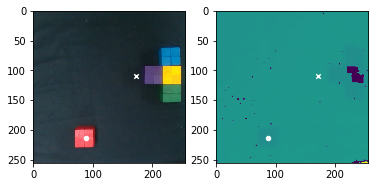

start pix : (88,214,678.0) -> goal pix : (172,109,723.0)
start pixel        goal pixek
x : 88.000000    x : 172.000000
y : 214.000000    y : 109.000000
z : 678.000000    z : 723.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.884548    x : 0.701967
y : -0.059545    y : 0.097401
z : -0.199066    z : -0.191794
x : -0.008133    x : -0.700638
y : 0.993651    y : 0.705680
z : -0.015927    z : 0.068266
w : 0.111072    w : 0.080382


-----------data 182----------


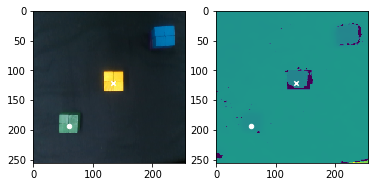

start pix : (59,193,678.0) -> goal pix : (134,122,621.0)
start pixel        goal pixek
x : 59.000000    x : 134.000000
y : 193.000000    y : 122.000000
z : 678.000000    z : 621.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.762535    x : 0.731726
y : -0.087674    y : 0.021510
z : -0.201498    z : -0.093476
x : -0.022770    x : -0.032441
y : 0.987963    y : 0.985845
z : -0.012360    z : -0.025338
w : 0.115251    w : 0.162527


-----------data 183----------


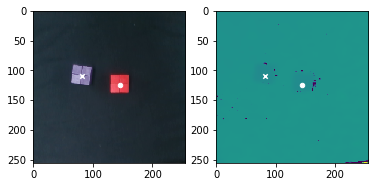

start pix : (145,124,676.0) -> goal pix : (82,110,673.0)
start pixel        goal pixek
x : 145.000000    x : 82.000000
y : 124.000000    y : 110.000000
z : 676.000000    z : 673.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.719559    x : 0.693756
y : 0.028104    y : -0.076977
z : -0.214994    z : -0.157919
x : 0.028573    x : 0.099325
y : 0.994738    y : 0.991972
z : -0.041101    z : -0.032582
w : 0.089393    w : 0.071172


-----------data 184----------


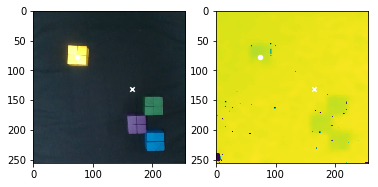

start pix : (73,77,676.941467285) -> goal pix : (165,132,724.1640625)
start pixel        goal pixek
x : 73.000000    x : 165.000000
y : 77.000000    y : 132.000000
z : 676.941467    z : 724.164062
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.647786    x : 0.747401
y : -0.068181    y : 0.084730
z : -0.205401    z : -0.199004
x : 0.036081    x : -0.019984
y : 0.994144    y : 0.996395
z : -0.016811    z : -0.005723
w : 0.100463    w : 0.082248


-----------data 185----------


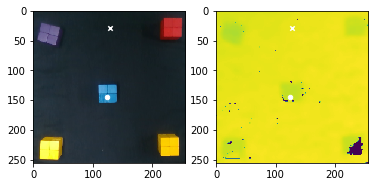

start pix : (124,145,677.4765625) -> goal pix : (128,28,714.0)
start pixel        goal pixek
x : 124.000000    x : 128.000000
y : 145.000000    y : 28.000000
z : 677.476562    z : 714.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.752117    x : 0.578659
y : 0.006084    y : 0.010324
z : -0.210312    z : -0.200937
x : -0.010265    x : -0.013402
y : 0.992372    y : 0.994170
z : -0.013686    z : -0.011765
w : 0.122088    w : 0.106341


-----------data 186----------


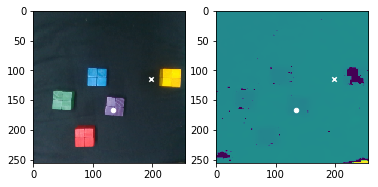

start pix : (134,166,676.296875) -> goal pix : (198,115,729.0)
start pixel        goal pixek
x : 134.000000    x : 198.000000
y : 166.000000    y : 115.000000
z : 676.296875    z : 729.000000
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.794985    x : 0.708973
y : 0.031484    y : 0.142986
z : -0.198870    z : -0.179039
x : 0.030533    x : 0.705814
y : 0.992300    y : -0.703236
z : 0.009583    z : -0.054876
w : 0.119655    w : -0.065383


-----------data 187----------


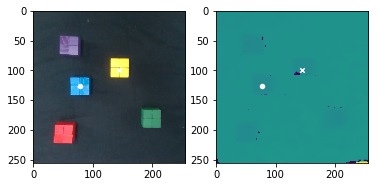

start pix : (78,127,673.0) -> goal pix : (144,99,678.0)
start pixel        goal pixek
x : 78.000000    x : 144.000000
y : 127.000000    y : 99.000000
z : 673.000000    z : 678.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.731863    x : 0.688553
y : -0.072142    y : 0.039080
z : -0.209643    z : -0.152761
x : 0.008107    x : 0.002687
y : 0.997498    y : 0.992803
z : -0.004042    z : -0.015411
w : 0.070119    w : 0.118734


-----------data 188----------


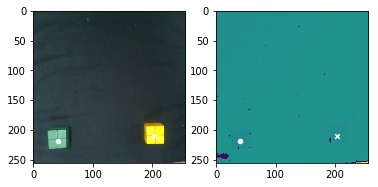

start pix : (41,219,680.032531738) -> goal pix : (203,211,694.4453125)
start pixel        goal pixek
x : 41.000000    x : 203.000000
y : 219.000000    y : 211.000000
z : 680.032532    z : 694.445312
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.886717    x : 0.887105
y : -0.124999    y : 0.138538
z : -0.204389    z : -0.147382
x : 0.031598    x : 0.026607
y : 0.985394    y : 0.983332
z : 0.017440    z : 0.037175
w : 0.166421    w : 0.175981


-----------data 189----------


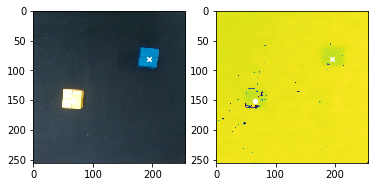

start pix : (66,152,0.0) -> goal pix : (195,81,678.0)
start pixel        goal pixek
x : 66.000000    x : 195.000000
y : 152.000000    y : 81.000000
z : 0.000000    z : 678.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.766412    x : 0.654498
y : -0.086621    y : 0.129797
z : -0.204477    z : -0.143647
x : 0.004617    x : 0.028592
y : 0.994633    y : 0.998514
z : -0.025206    z : -0.018788
w : 0.100244    w : 0.042426


-----------data 190----------


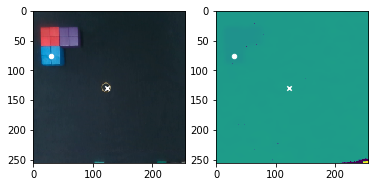

start pix : (30,76,676.0) -> goal pix : (123,129,736.0)
start pixel        goal pixek
x : 30.000000    x : 123.000000
y : 76.000000    y : 129.000000
z : 676.000000    z : 736.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.640243    x : 0.739083
y : -0.171634    y : -0.019513
z : -0.211900    z : -0.211317
x : -0.024772    x : -0.041522
y : 0.997251    y : 0.993339
z : 0.043171    z : -0.004141
w : 0.054883    w : 0.107411


-----------data 191----------


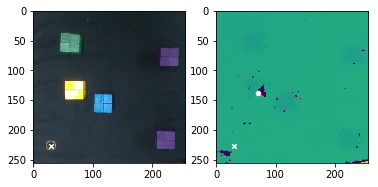

start pix : (70,138,714.0859375) -> goal pix : (30,227,722.3203125)
start pixel        goal pixek
x : 70.000000    x : 30.000000
y : 138.000000    y : 227.000000
z : 714.085937    z : 722.320313
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.742347    x : 0.906499
y : -0.084805    y : -0.157794
z : -0.197544    z : -0.194823
x : 0.006977    x : -0.028688
y : 0.998947    y : 0.994077
z : 0.013730    z : 0.017058
w : 0.043228    w : 0.103422


-----------data 192----------


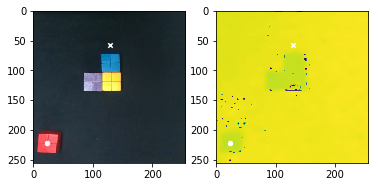

start pix : (23,223,674.6171875) -> goal pix : (129,57,722.0)
start pixel        goal pixek
x : 23.000000    x : 129.000000
y : 223.000000    y : 57.000000
z : 674.617188    z : 722.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.881298    x : 0.595802
y : -0.146505    y : 0.009512
z : -0.205118    z : -0.202127
x : 0.001932    x : -0.055867
y : 0.983660    y : 0.994638
z : -0.014445    z : -0.011701
w : 0.179446    w : 0.086241


-----------data 193----------


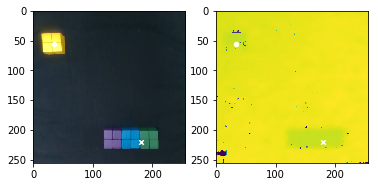

start pix : (34,56,682.1015625) -> goal pix : (180,220,681.88861084)
start pixel        goal pixek
x : 34.000000    x : 180.000000
y : 56.000000    y : 220.000000
z : 682.101562    z : 681.888611
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.612861    x : 0.891103
y : -0.139862    y : 0.097639
z : -0.198654    z : -0.135252
x : -0.020331    x : 0.020900
y : 0.997822    y : 0.988003
z : -0.032530    z : -0.002186
w : 0.053663    w : 0.152999


-----------data 194----------


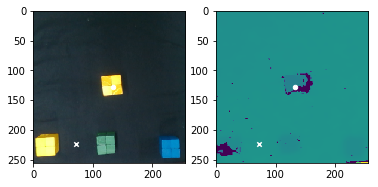

start pix : (133,128,471.359375) -> goal pix : (72,224,728.1171875)
start pixel        goal pixek
x : 133.000000    x : 72.000000
y : 128.000000    y : 224.000000
z : 471.359375    z : 728.117188
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.735983    x : 0.903185
y : 0.015598    y : -0.083836
z : -0.151184    z : -0.198110
x : -0.014150    x : -0.008960
y : 0.995148    y : 0.990175
z : 0.005898    z : -0.007598
w : 0.097192    w : 0.139341


-----------data 195----------


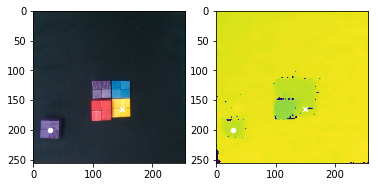

start pix : (28,200,675.101013184) -> goal pix : (149,165,681.4140625)
start pixel        goal pixek
x : 28.000000    x : 149.000000
y : 200.000000    y : 165.000000
z : 675.101013    z : 681.414062
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.863013    x : 0.786054
y : -0.152900    y : 0.065957
z : -0.207966    z : -0.153834
x : -0.006984    x : 0.737676
y : 0.982973    y : -0.662113
z : -0.021099    z : -0.071851
w : 0.182399    w : -0.110808


-----------data 196----------


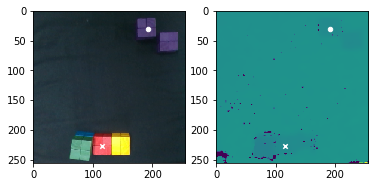

start pix : (192,31,677.0) -> goal pix : (116,228,675.817321777)
start pixel        goal pixek
x : 192.000000    x : 116.000000
y : 31.000000    y : 228.000000
z : 677.000000    z : 675.817322
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.563113    x : 0.898500
y : 0.108393    y : -0.019065
z : -0.204053    z : -0.147809
x : -0.116357    x : -0.695620
y : 0.992862    y : 0.704407
z : 0.003451    z : -0.066348
w : 0.025962    w : 0.124586


-----------data 197----------


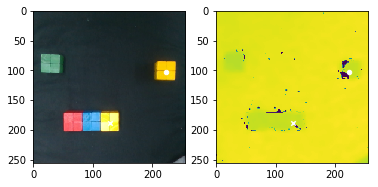

start pix : (223,103,680.0) -> goal pix : (129,188,687.0)
start pixel        goal pixek
x : 223.000000    x : 129.000000
y : 103.000000    y : 188.000000
z : 680.000000    z : 687.000000
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.692938    x : 0.831629
y : 0.177295    y : 0.021887
z : -0.199250    z : -0.138759
x : 0.009293    x : -0.695321
y : 0.991469    y : 0.700450
z : 0.055881    z : 0.104250
w : 0.117391    w : 0.122599


-----------data 198----------


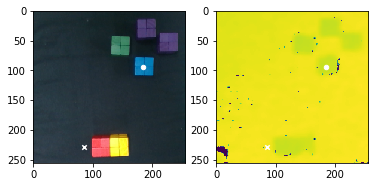

start pix : (185,94,679.0) -> goal pix : (85,229,725.1640625)
start pixel        goal pixek
x : 185.000000    x : 85.000000
y : 94.000000    y : 229.000000
z : 679.000000    z : 725.164062
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.675131    x : 0.889591
y : 0.116575    y : -0.057213
z : -0.193426    z : -0.185388
x : -0.023814    x : -0.677261
y : 0.996298    y : 0.723483
z : 0.054202    z : -0.043870
w : 0.062339    w : 0.126357


-----------data 199----------


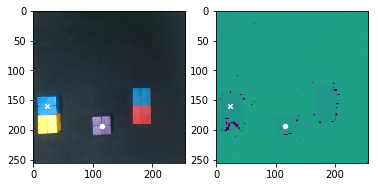

start pix : (116,193,684.0) -> goal pix : (23,160,677.901306152)
start pixel        goal pixek
x : 116.000000    x : 23.000000
y : 193.000000    y : 160.000000
z : 684.000000    z : 677.901306
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.827900    x : 0.766274
y : -0.028072    y : -0.172276
z : -0.212295    z : -0.155444
x : 0.043035    x : 0.017777
y : 0.997734    y : 0.999575
z : -0.018449    z : -0.001700
w : 0.048306    w : 0.023027


-----------data 200----------


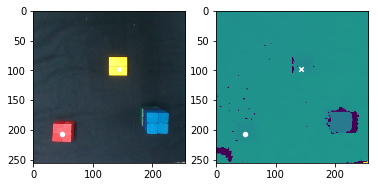

start pix : (48,207,678.0) -> goal pix : (143,98,685.1328125)
start pixel        goal pixek
x : 48.000000    x : 143.000000
y : 207.000000    y : 98.000000
z : 678.000000    z : 685.132813
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.874045    x : 0.701202
y : -0.121959    y : 0.038054
z : -0.192128    z : -0.130436
x : 0.047098    x : 0.015083
y : 0.985143    y : 0.985880
z : -0.017177    z : 0.008785
w : 0.164257    w : 0.166543




In [6]:
x_array = []
x_ori_array = []
y_array = []
mean_depth = 0
# resume = int(input('where do you want to start from? : '))
resume = 0
for i in range(resume, num_data):
    curr_data = joblib.load(os.path.join(pp_path,data_list[i]))
    print('-----------data {0}----------'.format(i))
    plt.figure(i)
    plt.subplot(121)
    plt.imshow(curr_data['image'])
    plt.scatter(curr_data['start_pix'][0], curr_data['start_pix'][1], s=20, c='w', marker='o')
    plt.scatter(curr_data['goal_pix'][0], curr_data['goal_pix'][1], s=20, c='w', marker='x')
    plt.subplot(122)
#     kernel = np.ones((10,10),np.float32)/100
#     dst = cv2.blur(curr_data['depth'],(10,10))
    plt.imshow(curr_data['depth'])
    mean_depth += curr_data['depth'].mean()
    plt.scatter(curr_data['start_pix'][0], curr_data['start_pix'][1], s=20, c='w', marker='o')
    plt.scatter(curr_data['goal_pix'][0], curr_data['goal_pix'][1], s=20, c='w', marker='x')
    plt.show()
    
    sx = curr_data['start_pix'][0]
    sy = curr_data['start_pix'][1]
    sz = curr_data['depth'][sy,sx]
    gx = curr_data['goal_pix'][0]
    gy = curr_data['goal_pix'][1]
    gz = curr_data['depth'][gy,gx]
    
    x = [sx,sy,sz,gx,gy,gz]
    
    pick_p_x = curr_data['pick'][0].x
    pick_p_y = curr_data['pick'][0].y
    pick_p_z = curr_data['pick'][0].z
    
    pick_o_x = curr_data['pick'][1].x
    pick_o_y = curr_data['pick'][1].y
    pick_o_z = curr_data['pick'][1].z
    pick_o_w = curr_data['pick'][1].w
    
    place_p_x = curr_data['place'][0].x
    place_p_y = curr_data['place'][0].y
    place_p_z = curr_data['place'][0].z
    
    place_o_x = curr_data['place'][1].x
    place_o_y = curr_data['place'][1].y
    place_o_z = curr_data['place'][1].z
    place_o_w = curr_data['place'][1].w
    
    y = [pick_p_x,pick_p_y,pick_p_z,pick_o_x,pick_o_y,pick_o_z, pick_o_w, 
         place_p_x,place_p_y,place_p_z,place_o_x,place_o_y,place_o_z,place_o_w]

    print('start pix : ({0},{1},{2}) -> goal pix : ({3},{4},{5})'.format(sx,sy,sz,gx,gy,gz))
    
#     print(data_list[i])
#     try :
#         pr = curr_data['pick_orientation']
#         while True:
#             key = int(input('pick orientation {0}- pass or not : '.format(pr)))
#             if key == 2 : 
#                 break
#             elif key == 0 or key == 1 :
#                 curr_data['pick_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue

#     except :  
#         while(True):
#             key = int(input('which orientation should I "PICK" this in? horizontal : 0 vertically : 1 - '))
#             if key == 0 or key == 1 :
#                 curr_data['pick_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue
    
#     so = curr_data['pick_orientation']
    
    
#     try :
#         while(True):
#             pr = curr_data['place_orientation']
#             key = int(input('place orienation {0}- pass or not : '.format(pr)))
#             if key == 2 : 
#                 break
#             elif key == 0 or key == 1 :
#                 curr_data['place_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue
        
#     except :  
#         while(True):
#             key = int(input('which orientation should I "PLACE" this in? horizontal : 0 vertically : 1 - '))
#             if key == 0 or key == 1 :
#                 curr_data['place_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue
    so = curr_data['pick_orientation']
    go = curr_data['place_orientation']
    x_ori = [sx,sy,sz,so,gx,gy,gz,go]
    pretty_print_input(x_ori,True)
    pretty_print_out(y)
    
    x_array.append(x)
    x_ori_array.append(x_ori)
    y_array.append(y)
#     joblib.dump(curr_data, os.path.join(pp_path,data_list[i]))
    

In [7]:
mean_depth = mean_depth/len(x_array)

In [8]:
# mean_depth = 733
mean_depth

714.6685133254879

In [9]:
x_array = np.array(x_array)
x_array[:,0:2] = (np.array(x_array)[:,0:2]-128)/128 
x_array[:,2] = (x_array[:,2] - mean_depth)/mean_depth
x_array[:,3:5] = (np.array(x_array)[:,3:5]-128)/128
x_array[:,5] = (x_array[:,5] - mean_depth)/mean_depth

In [10]:
x_ori_array = np.array(x_ori_array)
x_ori_array[:,0:2] = (np.array(x_ori_array)[:,0:2]-128)/128 
x_ori_array[:,2] = (x_ori_array[:,2] - mean_depth)/mean_depth
x_ori_array[:,4:6] = (np.array(x_ori_array)[:,4:6]-128)/128
x_ori_array[:,6] = (x_ori_array[:,6] - mean_depth)/mean_depth

In [11]:
pretty_print_input(x_array[0])

start pixel        goal pixek
x : -0.570312    x : 0.742188
y : -0.445312    y : 0.773438
z : -0.038857    z : 0.022852




In [12]:
pretty_print_input(x_ori_array[0],True)

start pixel        goal pixek
x : -0.570312    x : 0.742188
y : -0.445312    y : 0.773438
z : -0.038857    z : 0.022852
o : 0.000000    o : 0.000000




In [13]:
print('x', np.array(x_array).shape)
print('x_ori', np.array(x_ori_array).shape)
print('y', np.array(y_array).shape)

('x', (201, 6))
('x_ori', (201, 8))
('y', (201, 14))


# Model Definition

In [14]:
# start와 goal을 아예 다른 네트워크로
class Model(object):
    def __init__(self, sess, name, input_size, output_size, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS):
        self.sess = sess
        self.batch_size = BATCH_SIZE
        self.learning_rate = LEARNING_RATE
        self.input = tf.placeholder(tf.float32, [None, input_size])
        self.target = tf.placeholder(tf.float32, [None, output_size])
        self.training = tf.placeholder(tf.bool) 
        with tf.variable_scope(name):
            init = tf.contrib.layers.xavier_initializer()
            x = tf.layers.dense(self.input, HIDDEN_UNITS, kernel_initializer=init)
            x = tf.layers.batch_normalization(x)
            x = tf.nn.leaky_relu(x)
            x = tf.layers.dropout(x, rate=0.5, training=self.training)

            x = tf.layers.dense(x, HIDDEN_UNITS, kernel_initializer=init)
            x = tf.layers.batch_normalization(x)
            x = tf.nn.leaky_relu(x)
            x = tf.layers.dropout(x, rate = 0.5, training=self.training)
            
            x = tf.layers.dense(x, HIDDEN_UNITS, kernel_initializer=init)
            x = tf.layers.batch_normalization(x)
            x = tf.nn.leaky_relu(x)
            x = tf.layers.dropout(x, rate = 0.5, training=self.training)

            self.output = tf.layers.dense(x, output_size, activation=tf.nn.leaky_relu, kernel_initializer=init)        

            #create the modeal
            self.mse_loss = tf.reduce_mean(tf.square(self.target - self.output))
            # weight_decay = tf.add_n([0.01*tf.nn.l2_loss(var) for var in self.weights if "kernel" in var.name])
            self.optimizer = tf.train.AdamOptimizer(self.learning_rate)
            self.optimize = self.optimizer.minimize(self.mse_loss)
            sess.run(tf.global_variables_initializer())
        
    def predict(self,inputs):
        pred_y = self.sess.run(self.output, feed_dict={self.input : inputs, self.training : False})
        return pred_y
    
    

# Pretrain

In [24]:
EPOCH = 1000
BATCH_SIZE = 1
LEARNING_RATE = 1e-6
HIDDEN_UNITS = 600
num_batches = len(x_array)/BATCH_SIZE -5
SAVE = 20
VALID = 20
print(num_batches)

196


In [ ]:
tf.reset_default_graph()
#with tf.Session() as sess:
sess = tf.Session()
pick_model = Model(sess,'pick', int(np.array(x_ori_array).shape[-1]/2), int(np.array(y_array).shape[-1]/2), BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
place_model = Model(sess,'place', int(np.array(x_ori_array).shape[-1]/2), int(np.array(y_array).shape[-1]/2), BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
lr = LEARNING_RATE
saver = tf.train.Saver(max_to_keep=40)
model_name = 'model5-normalized-batchsize{0},lr{1},hidden{2},VALID{3}'.format(BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS,VALID)

if not os.path.exists('saved_networks/'+model_name):
        os.makedirs('saved_networks/'+model_name)
writer = SummaryWriter('logs/pretrain/{0}'.format(model_name))
for e in range(EPOCH):
    pick_loss = 0 
    place_loss = 0
    for i in range(num_batches-VALID):
        feed_dict = {pick_model.input:np.array(x_ori_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1),0:4],
                    pick_model.target:np.array(y_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1),0:7],
                     pick_model.training : True
                    }
        sess.run(pick_model.optimize, feed_dict=feed_dict)
        pick_loss += sess.run(pick_model.mse_loss,feed_dict=feed_dict)
        
        feed_dict = {place_model.input:np.array(x_ori_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1),4:8],
                    place_model.target:np.array(y_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1),7:14],
                    place_model.training : True}
        sess.run(place_model.optimize, feed_dict=feed_dict)
        place_loss += sess.run(place_model.mse_loss,feed_dict=feed_dict)
    
    v_pick_loss = 0
    v_place_loss = 0
    
    for j in range(VALID):
        feed_dict = {pick_model.input:np.array(x_ori_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*((num_batches-VALID+1+j)),0:4],
                     pick_model.target:np.array(y_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*((num_batches-VALID+1+j)),0:7],
                    pick_model.training : False}
        v_pick_loss += sess.run(pick_model.mse_loss,feed_dict=feed_dict)
        
        feed_dict = {place_model.input:np.array(x_ori_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*((num_batches-VALID+1+j)),4:8],
                     place_model.target:np.array(y_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*((num_batches-VALID+1+j)),7:14]
                    ,place_model.training : False}
        v_place_loss += sess.run(place_model.mse_loss,feed_dict=feed_dict)
        
        
        if e % SAVE == 0:
            print('====== valid test ======')
            print('target')
            pretty_print_out(np.array(y_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*(num_batches-VALID+j)+1])
            print('predict')
            pick_predict = pick_model.predict(np.array(x_ori_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*(num_batches-VALID+j)+1,0:4])
            place_predict = place_model.predict(np.array(x_ori_array)[BATCH_SIZE*(num_batches-VALID+j):BATCH_SIZE*(num_batches-VALID+j)+1,4:8])
            pretty_print_out(np.concatenate([pick_predict, place_predict],-1))
            print('\n')
            
    writer.add_scalars('pick_loss',{'train_loss': pick_loss/(num_batches-VALID), 'valid_loss': v_pick_loss/VALID},e)
    writer.add_scalars('place_loss',{'train_loss': place_loss/(num_batches-VALID), 'valid_loss': v_place_loss/VALID},e)
  
    
    if e % SAVE == 0:
        saver.save(sess, 'saved_networks/pretrain/' + model_name+'/network-{0}'.format(e))

    #print(model.optimizer.learning_rate())
    print('epoch {0} pick  loss {1} v_loss {2}'.format(e,pick_loss/(num_batches-VALID),v_pick_loss/VALID))
    print('          place loss {0} v_loss {1}'.format(place_loss/(num_batches-VALID),v_place_loss/VALID))

# pretty_print_out(pick_model.predict(np.array(x_array)[-1,:].reshape(-1,np.array(x_array).shape[-1])))
# pretty_print_out(np.array(y_array)[-1,:])
    
    

====== valid test ======
target
start pose        goal pose
x : 0.777084    x : 0.644521
y : -0.002790    y : 0.090073
z : -0.195823    z : -0.190355
x : 0.730311    x : 0.996539
y : -0.651581    y : 0.067728
z : 0.202941    z : 0.048129
w : 0.030037    w : 0.002636


predict
start pose        goal pose
x : -0.000705    x : -0.002629
y : -0.008600    y : 0.000713
z : 0.018406    z : -0.000259
x : 0.036821    x : 0.004424
y : -0.012112    y : -0.004277
z : -0.007566    z : 0.005697
w : 0.020557    w : -0.001168




====== valid test ======
target
start pose        goal pose
x : 0.860954    x : 0.613543
y : -0.104726    y : 0.164980
z : -0.207245    z : -0.093508
x : 0.686913    x : 0.032275
y : 0.721099    y : 0.990831
z : 0.024127    z : 0.083276
w : 0.087097    w : 0.101374


predict
start pose        goal pose
x : -0.000658    x : -0.005685
y : -0.009284    y : 0.003512
z : -0.000696    z : -0.000744
x : 0.064735    x : 0.008460
y : -0.015822    y : -0.007634
z : -0.008355    z : 0.0

epoch 0 pick  loss 0.224613367495 v_loss 0.230886224657
          place loss 0.234256622128 v_loss 0.230135338008
epoch 1 pick  loss 0.222586038522 v_loss 0.228681874275
          place loss 0.23119695764 v_loss 0.229491971433
epoch 2 pick  loss 0.221987161193 v_loss 0.226478897035
          place loss 0.228888049129 v_loss 0.228405400366
epoch 3 pick  loss 0.218617941084 v_loss 0.224177721143
          place loss 0.227622585625 v_loss 0.226881445944
epoch 4 pick  loss 0.214636991478 v_loss 0.221886267513
          place loss 0.225874010389 v_loss 0.224929285049
epoch 5 pick  loss 0.212810976007 v_loss 0.219552160054
          place loss 0.226514824835 v_loss 0.222785698622
epoch 6 pick  loss 0.210339462808 v_loss 0.217169670761
          place loss 0.223411599428 v_loss 0.2204179205
epoch 7 pick  loss 0.209084887227 v_loss 0.214771329612
          place loss 0.222380559468 v_loss 0.217861605436
epoch 8 pick  loss 0.205562015911 v_loss 0.212321377546
          place loss 0.215774861588

epoch 20 pick  loss 0.168375171044 v_loss 0.172429175675
          place loss 0.18486188695 v_loss 0.183704726398
epoch 21 pick  loss 0.162723191167 v_loss 0.168869241327
          place loss 0.182120435279 v_loss 0.181302825361
epoch 22 pick  loss 0.157084380657 v_loss 0.165318653733
          place loss 0.179885887922 v_loss 0.178958110511
epoch 23 pick  loss 0.155114142605 v_loss 0.161795577407
          place loss 0.178656258663 v_loss 0.176674364507
epoch 24 pick  loss 0.153459503993 v_loss 0.158305472881
          place loss 0.172183930535 v_loss 0.174368138611
epoch 25 pick  loss 0.151035190475 v_loss 0.154799981788
          place loss 0.16680463594 v_loss 0.172061934322
epoch 26 pick  loss 0.145448748827 v_loss 0.151302633062
          place loss 0.170536408074 v_loss 0.169825726748
epoch 27 pick  loss 0.141700869595 v_loss 0.147869288921
          place loss 0.167931071356 v_loss 0.167597030103
epoch 28 pick  loss 0.140959610739 v_loss 0.144433816895
          place loss 0.16

epoch 40 pick  loss 0.103626862507 v_loss 0.10500954669
          place loss 0.135114488234 v_loss 0.1413098149
epoch 41 pick  loss 0.0995674366131 v_loss 0.10196985472
          place loss 0.13183726182 v_loss 0.139451692626
epoch 42 pick  loss 0.0919707225403 v_loss 0.0989749634638
          place loss 0.129498022249 v_loss 0.137608347461
epoch 43 pick  loss 0.093869960634 v_loss 0.0960333349183
          place loss 0.126830121714 v_loss 0.135835871845
epoch 44 pick  loss 0.0910063042009 v_loss 0.0931578004733
          place loss 0.128343860365 v_loss 0.134084969759
epoch 45 pick  loss 0.0866522469918 v_loss 0.0903510794044
          place loss 0.125285693317 v_loss 0.132407876849
epoch 46 pick  loss 0.0856253902682 v_loss 0.0875613793731
          place loss 0.12247271531 v_loss 0.130702090636
epoch 47 pick  loss 0.0813427324809 v_loss 0.0848159525543
          place loss 0.123708469158 v_loss 0.129047035053
epoch 48 pick  loss 0.0795160038714 v_loss 0.0820770587772
          place

epoch 60 pick  loss 0.0596345574039 v_loss 0.0557382519823
          place loss 0.099196194724 v_loss 0.110060403496
epoch 61 pick  loss 0.0547220072794 v_loss 0.0541100086644
          place loss 0.102434419805 v_loss 0.108805739693
epoch 62 pick  loss 0.0540704369222 v_loss 0.0526566061191
          place loss 0.0962031961376 v_loss 0.107606212422
epoch 63 pick  loss 0.0553365753757 v_loss 0.0511625485029
          place loss 0.0955873875805 v_loss 0.106385697611
epoch 64 pick  loss 0.050567409058 v_loss 0.0497727634851
          place loss 0.0969913340258 v_loss 0.105204283074
epoch 65 pick  loss 0.0485687348304 v_loss 0.048443635134
          place loss 0.0946601548454 v_loss 0.104074345343
epoch 66 pick  loss 0.0500955703213 v_loss 0.0472079258878
          place loss 0.0925308619626 v_loss 0.102975240536
epoch 67 pick  loss 0.0498458200521 v_loss 0.0461117598228
          place loss 0.0946232381658 v_loss 0.10186233744
epoch 68 pick  loss 0.0499265830678 v_loss 0.0449499276932
  

epoch 80 pick  loss 0.0420028024713 v_loss 0.0366683794186
          place loss 0.0814841920113 v_loss 0.0899413714185
epoch 81 pick  loss 0.0421040132113 v_loss 0.036203767173
          place loss 0.0834245052009 v_loss 0.0891676426865
epoch 82 pick  loss 0.0416667106884 v_loss 0.0358474165434
          place loss 0.0805099512773 v_loss 0.0883991354145
epoch 83 pick  loss 0.0418365921426 v_loss 0.0354605507338
          place loss 0.0824464935206 v_loss 0.0876977473497
epoch 84 pick  loss 0.0402972668182 v_loss 0.0351017489797
          place loss 0.0819617065268 v_loss 0.0869845952839
epoch 85 pick  loss 0.042472200156 v_loss 0.0347918989835
          place loss 0.0795741443872 v_loss 0.0862933136523
epoch 86 pick  loss 0.0395684688503 v_loss 0.0345001948765
          place loss 0.0787281861809 v_loss 0.0855864860117
epoch 87 pick  loss 0.0412805521324 v_loss 0.0342914866516
          place loss 0.0760699069202 v_loss 0.0849373166449
epoch 88 pick  loss 0.0395486407003 v_loss 0.03398

epoch 100 pick  loss 0.0378571142765 v_loss 0.0311128155794
          place loss 0.0691629450382 v_loss 0.0777694656979
epoch 101 pick  loss 0.0375793016098 v_loss 0.0309408504516
          place loss 0.0731391887966 v_loss 0.0773104321677
epoch 102 pick  loss 0.0358532996761 v_loss 0.0307318002917
          place loss 0.0700553663535 v_loss 0.0768409968819
epoch 103 pick  loss 0.0344978445501 v_loss 0.0306060301373
          place loss 0.0696344809654 v_loss 0.0764135705307
epoch 104 pick  loss 0.0382098880046 v_loss 0.030461948528
          place loss 0.0683597563422 v_loss 0.0759562815074
epoch 105 pick  loss 0.0365534272661 v_loss 0.0303257961059
          place loss 0.0690934007818 v_loss 0.0755015077069
epoch 106 pick  loss 0.0382105392359 v_loss 0.0301601457875
          place loss 0.0670454612012 v_loss 0.0750482629519
epoch 107 pick  loss 0.0392344426734 v_loss 0.0300163805019
          place loss 0.0709161284335 v_loss 0.0746590007562
epoch 108 pick  loss 0.0353418206148 v_lo

epoch 120 pick  loss 0.0339370450648 v_loss 0.0281220796751
          place loss 0.0615525381171 v_loss 0.0695887522306
epoch 121 pick  loss 0.0345330557532 v_loss 0.0279926132178
          place loss 0.0638015362519 v_loss 0.0692606303375
epoch 122 pick  loss 0.0358772318061 v_loss 0.0278420404764
          place loss 0.0616203615527 v_loss 0.0688905207906
epoch 123 pick  loss 0.0351783002499 v_loss 0.0277125105262
          place loss 0.0622107897097 v_loss 0.0685416523833
epoch 124 pick  loss 0.0334213359416 v_loss 0.0275960087311
          place loss 0.0644950949963 v_loss 0.0682118597673
epoch 125 pick  loss 0.0341499417356 v_loss 0.0274699298432
          place loss 0.0615240096019 v_loss 0.0678845987655
epoch 126 pick  loss 0.0364765067769 v_loss 0.0273501567775
          place loss 0.0607112771342 v_loss 0.0675466323504
epoch 127 pick  loss 0.0353404338318 v_loss 0.0272478574188
          place loss 0.059710201466 v_loss 0.0672096919268
epoch 128 pick  loss 0.0318755176281 v_lo

epoch 140 pick  loss 0.0318265205622 v_loss 0.0259079140029
          place loss 0.0566588260236 v_loss 0.0637991134077
epoch 141 pick  loss 0.0333487244471 v_loss 0.0258177540032
          place loss 0.0595898843272 v_loss 0.0635710420785
epoch 142 pick  loss 0.0321798386784 v_loss 0.025757884176
          place loss 0.0591201135275 v_loss 0.0633267512312
epoch 143 pick  loss 0.0331196884442 v_loss 0.0257136142929
          place loss 0.059782929061 v_loss 0.0630841439124
epoch 144 pick  loss 0.0309060035678 v_loss 0.0255992649705
          place loss 0.0612193312448 v_loss 0.0628819609992
epoch 145 pick  loss 0.0337027283954 v_loss 0.0254870294826
          place loss 0.0563593926014 v_loss 0.0627257014392
epoch 146 pick  loss 0.0316185905619 v_loss 0.0254191589192
          place loss 0.0589827911608 v_loss 0.0625420607394
epoch 147 pick  loss 0.0312403353455 v_loss 0.0253191358526
          place loss 0.057379780029 v_loss 0.0623749623308
epoch 148 pick  loss 0.0319401019244 v_loss

epoch 160 pick  loss 0.0298611823118 v_loss 0.0242221358116
          place loss 0.0560154320113 v_loss 0.0599518062547
epoch 161 pick  loss 0.0299996862437 v_loss 0.0241180201992
          place loss 0.0511771830815 v_loss 0.0597722525708
epoch 162 pick  loss 0.0311210774578 v_loss 0.0240604527411
          place loss 0.0548290123221 v_loss 0.0595707493369
epoch 163 pick  loss 0.0315635572558 v_loss 0.0239707743749
          place loss 0.0532570213426 v_loss 0.0593440670869
epoch 164 pick  loss 0.0299482580786 v_loss 0.0238815843943
          place loss 0.0541698600322 v_loss 0.0591787473182
epoch 165 pick  loss 0.03010808737 v_loss 0.0238278081291
          place loss 0.0526413825064 v_loss 0.0589986847132
epoch 166 pick  loss 0.0309629429791 v_loss 0.0237127411063
          place loss 0.0530889236397 v_loss 0.0588266933919
epoch 167 pick  loss 0.0294092378668 v_loss 0.0236313412548
          place loss 0.0556550818067 v_loss 0.0587023184285
epoch 168 pick  loss 0.0306600260797 v_los

epoch 180 pick  loss 0.0304358568246 v_loss 0.0227224127389
          place loss 0.0527178995154 v_loss 0.0568729763734
epoch 181 pick  loss 0.0297773269148 v_loss 0.0226615236141
          place loss 0.0505070651297 v_loss 0.05669238189


In [ ]:
EPOCH = 1000
BATCH_SIZE = 1
LEARNING_RATE = 1e-6
HIDDEN_UNITS = 600
num_batches = len(x_array)/BATCH_SIZE -5
SAVE = 20
VALID = 5
print(num_batches)

In [21]:

tf.reset_default_graph()

#with tf.Session() as sess:
sess = tf.Session()
pick_model = Model(sess,'pick', int(np.array(x_ori_array).shape[-1]/2), int(np.array(y_array).shape[-1]/2), BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
place_model = Model(sess,'place', int(np.array(x_ori_array).shape[-1]/2), int(np.array(y_array).shape[-1]/2), BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
saver = tf.train.Saver(max_to_keep=40)
checkpoint = tf.train.get_checkpoint_state("saved_networks/pretrain/"+'model5-normalized-batchsize1,lr1e-05,hidden600,VALID20')
if checkpoint and checkpoint.model_checkpoint_path:
    saver.restore(sess, checkpoint.model_checkpoint_path)
    print("Successfully loaded:", checkpoint.model_checkpoint_path)
else:
    print("Could not find old network weights")


INFO:tensorflow:Restoring parameters from saved_networks/pretrain/model5-normalized-batchsize1,lr1e-05,hidden600,VALID20/network-200
('Successfully loaded:', u'saved_networks/pretrain/model5-normalized-batchsize1,lr1e-05,hidden600,VALID20/network-200')


In [22]:
test_loss = 0
for k in range(5):
    print('='*50)
    print('target')
    pretty_print_out(np.array(y_array)[195+k])
    print('predict')
    pick_predict = pick_model.predict(np.array(x_ori_array)[195+k,0:4].reshape(-1,4))
    place_predict = place_model.predict(np.array(x_ori_array)[195+k,4:8].reshape(-1,4))
    pretty_print_out(np.concatenate([pick_predict, place_predict],-1))
    
    test_loss += np.mean(np.square(np.array(y_array)[195+k]-np.concatenate([pick_predict, place_predict],-1)))

print('test_loss : {0}'.format(test_loss/5))

target
start pose        goal pose
x : 0.863013    x : 0.786054
y : -0.152900    y : 0.065957
z : -0.207966    z : -0.153834
x : -0.006984    x : 0.737676
y : 0.982973    y : -0.662113
z : -0.021099    z : -0.071851
w : 0.182399    w : -0.110808


predict
start pose        goal pose
x : 0.771317    x : 0.692875
y : -0.082630    y : 0.016074
z : -0.177603    z : -0.134986
x : -0.010565    x : 0.069686
y : 0.924465    y : -0.039626
z : -0.020562    z : -0.015090
w : 0.113651    w : -0.024166


target
start pose        goal pose
x : 0.563113    x : 0.898500
y : 0.108393    y : -0.019065
z : -0.204053    z : -0.147809
x : -0.116357    x : -0.695620
y : 0.992862    y : 0.704407
z : 0.003451    z : -0.066348
w : 0.025962    w : 0.124586


predict
start pose        goal pose
x : 0.540845    x : 0.790321
y : 0.116962    y : -0.016731
z : -0.175498    z : -0.144784
x : -0.049798    x : 0.243528
y : 0.935692    y : -0.080733
z : -0.016517    z : -0.022965
w : 0.045888    w : -0.035577


target
s

In [ ]:
# 65 196 681 / 226 31 732 start pix : (62,194,678.0) -> goal pix : (227,30,736.0)
#62 194 678 227 30 736
mean_depth = 714.6685133254879
start_x = (0-128)/128.0
start_y = (0-128)/128.0
goal_x = (255-128)/128.0
goal_y = (255-128)/128.0
sz = (678-mean_depth)/mean_depth
gz = (736-mean_depth)/mean_depth
y_1 = pick_model.predict(np.array([start_x, start_y, sz, 0]).reshape(-1,4))
y_2 = place_model.predict(np.array([goal_x, goal_y, gz, 0]).reshape(-1,4))
y = np.concatenate([y_1,y_2],-1)
pretty_print_out(y)

In [23]:
for i in range(200):
    print("="*40)
    test_idx = i
    y_1 = pick_model.predict(np.array(x_ori_array[test_idx,0:4]).reshape(-1,4))
    y_2 = place_model.predict(np.array(x_ori_array[test_idx,4:8]).reshape(-1,4))
    y = np.concatenate([y_1,y_2],-1)
    pretty_print_out(y)
    pretty_print_out(y_array[test_idx])
    print("="*40)


start pose        goal pose
x : 0.587260    x : 0.836123
y : -0.065162    y : 0.180051
z : -0.175691    z : -0.161601
x : -0.032058    x : -0.030141
y : 0.928103    y : 0.888546
z : -0.018700    z : -0.008153
w : 0.035877    w : 0.168569


start pose        goal pose
x : 0.629413    x : 0.911041
y : -0.101985    y : 0.183149
z : -0.193915    z : -0.167904
x : 0.025451    x : -0.050049
y : 0.996479    y : 0.962426
z : -0.015449    z : 0.062829
w : 0.078377    w : 0.259391


start pose        goal pose
x : 0.540078    x : 0.776115
y : -0.012304    y : 0.021932
z : -0.176641    z : -0.148373
x : -0.044706    x : -0.027519
y : 0.940727    y : 0.877286
z : -0.018450    z : -0.011048
w : 0.028705    w : 0.118108


start pose        goal pose
x : 0.573285    x : 0.822622
y : 0.010760    y : 0.052869
z : -0.207535    z : -0.150223
x : -0.048992    x : 0.015886
y : 0.992040    y : 0.990926
z : -0.047899    z : -0.039289
w : 0.105652    w : 0.127552


start pose        goal pose
x : 0.589927    

start pose        goal pose
x : 0.815338    x : 0.756093
y : 0.078603    y : -0.052501
z : -0.181735    z : -0.139163
x : -0.026814    x : -0.024825
y : 0.928934    y : 0.863994
z : -0.009573    z : -0.017142
w : 0.172030    w : 0.094443


start pose        goal pose
x : 0.882718    x : 0.823366
y : 0.109240    y : -0.048987
z : -0.209262    z : -0.195473
x : 0.016556    x : -0.005287
y : 0.975297    y : 0.972121
z : 0.013528    z : -0.004852
w : 0.219861    w : 0.234370


start pose        goal pose
x : 0.743553    x : 0.668638
y : -0.060626    y : 0.047179
z : -0.173761    z : -0.144822
x : -0.015382    x : -0.033647
y : 0.933296    y : 0.925487
z : -0.019258    z : -0.013524
w : 0.106130    w : 0.086555


start pose        goal pose
x : 0.785352    x : 0.679068
y : -0.092542    y : 0.079258
z : -0.162106    z : -0.159576
x : -0.028916    x : 0.019138
y : 0.993109    y : 0.997790
z : -0.024795    z : -0.032547
w : 0.110831    w : 0.054672


start pose        goal pose
x : 0.739803   

start pose        goal pose
x : 0.775209    x : 0.674425
y : 0.048224    y : -0.049476
z : -0.178064    z : -0.136048
x : -0.027547    x : 0.305020
y : 0.935896    y : -0.073302
z : -0.010924    z : -0.026718
w : 0.141394    w : -0.035384


start pose        goal pose
x : 0.821324    x : 0.751731
y : 0.076273    y : -0.069301
z : -0.202951    z : -0.194926
x : -0.037850    x : 0.704499
y : 0.984355    y : -0.690126
z : -0.005481    z : -0.093702
w : 0.171997    w : -0.136482


start pose        goal pose
x : 0.714151    x : 0.540332
y : -0.059285    y : -0.096324
z : -0.175484    z : -0.145506
x : -0.019060    x : -0.020869
y : 0.940125    y : 0.927747
z : -0.018838    z : -0.023227
w : 0.090970    w : 0.085854


start pose        goal pose
x : 0.762535    x : 0.575178
y : -0.087674    y : -0.154835
z : -0.201498    z : -0.190609
x : -0.064190    x : -0.038272
y : 0.992200    y : 0.996928
z : 0.011090    z : -0.013165
w : 0.106100    w : 0.067056


start pose        goal pose
x : 0.732

start pose        goal pose
x : 0.689577    x : 0.608721
y : -0.011430    y : 0.060787
z : -0.146627    z : -0.141289
x : 0.267702    x : -0.033863
y : -0.011730    y : 0.883542
z : -0.009221    z : -0.013518
w : -0.015109    w : 0.077570


start pose        goal pose
x : 0.777084    x : 0.644521
y : -0.002790    y : 0.090073
z : -0.195823    z : -0.190355
x : 0.730311    x : 0.996539
y : -0.651581    y : 0.067728
z : 0.202941    z : 0.048129
w : 0.030037    w : 0.002636


start pose        goal pose
x : 0.767647    x : 0.581217
y : -0.050189    y : 0.189109
z : -0.145243    z : -0.146010
x : 0.788816    x : -0.047437
y : -0.095321    y : 0.952018
z : -0.005645    z : -0.013197
w : -0.022221    w : 0.073005


start pose        goal pose
x : 0.860954    x : 0.613543
y : -0.104726    y : 0.164980
z : -0.207245    z : -0.093508
x : 0.686913    x : 0.032275
y : 0.721099    y : 0.990831
z : 0.024127    z : 0.083276
w : 0.087097    w : 0.101374


start pose        goal pose
x : 0.757044    x